# WDSR

In [1]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf

from data import Thermal
from model.nmodel import wdsr_b
from train import WdsrTrainer
#from tensorflow.compat.v2.keras.utils import multi_gpu_model
import argparse

%matplotlib inline

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

In [2]:
import os
from tensorflow.python.client import device_lib
# check GPU
def get_available_gpus():
    local_device_protos = device_lib.list_local_devices()
    return [x.name for x in local_device_protos if x.device_type == 'GPU']

In [3]:
def solve_cudnn_error():
    gpus = tf.config.experimental.list_physical_devices('GPU')
    if gpus:
        try:
            # Currently, memory growth needs to be the same across GPUs
            for gpu in gpus:
                tf.config.experimental.set_memory_growth(gpu, True)
            logical_gpus = tf.config.experimental.list_logical_devices('GPU')
            print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
        except RuntimeError as e:
            # Memory growth must be set before GPUs have been initialized
            print(e)

In [4]:

solve_cudnn_error()

1 Physical GPUs, 1 Logical GPUs


In [5]:
get_available_gpus()
os.environ["CUDA_VISIBLE_DEVICES"] = "1,2"

In [6]:
# Number of residual blocks
depth = 32

# Super-resolution factor
scale = 4

# Downgrade operator
downgrade = 'bicubic'

In [7]:
# Location of model weights (needed for demo)
weights_dir = f'weights/wdsr-b-{depth}-x{scale}'
weights_file = os.path.join(weights_dir, 'M288ncan_edge_wdsr_weights.h5')

os.makedirs(weights_dir, exist_ok=True)

## Training Part:

In [8]:
Thermal_train = Thermal(scale=scale, subset='train', downgrade=downgrade)
Thermal_valid = Thermal(scale=scale, subset='valid', downgrade=downgrade)

In [9]:
train_ds = Thermal_train.dataset(batch_size=16, random_transform=True)
valid_ds = Thermal_valid.dataset(batch_size=1, random_transform=False, repeat_count=1)

LR_Image Directory:
/mnt/d/data/Thermal_train_LR_bicubic/X4
HR_Image Directory:
/mnt/d/data/Thermal_train_HR
LR_Image Directory:
/mnt/d/data/Thermal_valid_LR_bicubic/X4
HR_Image Directory:
/mnt/d/data/Thermal_valid_HR


### Pre-trained models

If you want to skip training and directly run the demo below, download [weights-wdsr-b-32-x4.tar.gz](https://martin-krasser.de/sisr/weights-wdsr-b-32-x4.tar.gz) and extract the archive in the project's root directory. This will create a `weights/wdsr-b-32-x4` directory containing the weights of the pre-trained model.

## Mobile WDSR (1st edition):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M28ncan_edge_wdsr-b-{depth}-x{scale}')

In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3')
1000/100000: loss = 14.254, PSNR = 21.979864 (104.89s)
2000/100000: loss = 3.214, PSNR = 32.900455 (89.73s)
3000/100000: loss = 2.318, PSNR = 35.595467 (90.24s)
4000/100000: loss = 2.053, PSNR = 36.188118 (90.17s)
5000/100000: loss = 1.928, PSNR = 31.111609 (89.74s)
6000/100000: loss = 1.739, PSNR = 35.130013 (90.07s)
7000/100000: loss = 1.637, PSNR = 38.674065 (90.25s)
8000/100000: loss = 1.731, PSNR = 37.535393 (89.71s)
9000/100000: loss = 1.582, PSNR = 38.795715 (89.47s)
10000/100000: loss = 1.422, PSNR = 38.176624 (89.54s)
11000/100000: loss = 1.258, PSNR = 39.210926 (89.09s)
12000/100000: loss = 1.457, PSNR = 38.561543 (89.74s)
13000/100000: loss = 1.426, PSNR = 39.968224 (89.51s)
14000/100000: loss = 1.325, PSNR = 40.154011 (89.57s)
15000/

## WDSR + Edge :

In [17]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/T3ncan_edge_wdsr-b-{depth}-x{scale}')

In [18]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 52491.668, PSNR = 25.135754 (112.99s)
2000/100000: loss = 88.970, PSNR = 26.305262 (93.40s)
3000/100000: loss = 89.689, PSNR = 28.954905 (93.33s)
4000/100000: loss = 34.702, PSNR = 31.878260 (93.57s)
5000/100000: loss = 28.020, PSNR = 33.885052 (93.33s)
6000/100000: loss = 2.854, PSNR = 32.752491 (93.00s)
7000/100000: loss = 57.996, PSNR = 34.142090 (92.91s)
8000/100000: loss = 2.388, PSNR = 36.411469 (93.18s)
9000/100000: loss = 2.176, PSNR = 35.931690 (93.16s)
10000/100000: loss = 2.089, PSNR = 36.316360 (93.40s)
11000/100000: loss = 2.004, PSNR = 37.084179 (92.99s)
12000/100000: loss = 2.006, PSNR = 37.372223 (92.89s)
13000/100000: loss = 2.166, PSNR = 37.032627 (92.50s)
14000/100000: loss = 794.432, PSNR = 8.421865 (93.33s)
15000/100000: loss = 205.892, PSNR = 15.528387 (93.39s)
16000/100000: loss = 69.386, PSNR = 19.621960 (92.88s)
17000/100000: loss = 20.434, PSNR = 27.433935 (93.05s)
18000/100000: loss = 5.106, PSNR = 34.272900 (93.28s)
19000/100000: loss = 5

## WDSR + Edge (2nd edition) (with 1 convolutional layer in skip connection in residual block):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M40ncan_edge_wdsr-b-{depth}-x{scale}')

In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 35017.496, PSNR = 23.153408 (150.93s)
2000/100000: loss = 49.069, PSNR = 28.128597 (120.83s)
3000/100000: loss = 14.529, PSNR = 30.585918 (120.66s)
4000/100000: loss = 7.203, PSNR = 32.278664 (120.05s)
5000/100000: loss = 4.859, PSNR = 34.220566 (119.74s)
6000/100000: loss = 3.589, PSNR = 34.477894 (119.82s)
7000/100000: loss = 2.842, PSNR = 35.403992 (119.99s)
8000/100000: loss = 2.472, PSNR = 36.497833 (119.25s)
9000/100000: loss = 2.225, PSNR = 35.245140 (118.85s)
10000/100000: loss = 2.078, PSNR = 35.740150 (119.60s)
11000/100000: loss = 2.231, PSNR = 37.405128 (118.45s)
12000/100000: loss = 1.827, PSNR = 36.863415 (119.35s)
13000/100000: loss = 1.750, PSNR = 37.716034 (119.79s)
14000/100000: loss = 1.678, PSNR = 38.099525 (120.03s)
15000/100000: loss = 1.611, PSNR = 38.628494 (120.47s)
16000/100000: loss = 1.549, PSNR = 39.159145 (120.62s)
17000/100000: loss = 1.478, PSNR = 39.424000 (120.27s)
18000/100000: loss = 1.418, PSNR = 39.581932 (119.78s)
19000/100000:

## WDSR + Edge (3rd edition) (Average Pooling):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M55ncan_edge_wdsr-b-{depth}-x{scale}')

In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 1240.993, PSNR = 24.020153 (119.06s)
2000/100000: loss = 30.381, PSNR = 28.258438 (98.26s)
3000/100000: loss = 14.354, PSNR = 29.313080 (98.13s)
4000/100000: loss = 8.013, PSNR = 32.379463 (97.77s)
5000/100000: loss = 4.925, PSNR = 34.150719 (97.64s)
6000/100000: loss = 3.593, PSNR = 34.464073 (98.19s)
7000/100000: loss = 2.920, PSNR = 35.669746 (98.25s)
8000/100000: loss = 2.547, PSNR = 35.470955 (98.44s)
9000/100000: loss = 2.395, PSNR = 35.110992 (98.45s)
10000/100000: loss = 2.200, PSNR = 37.236683 (97.95s)
11000/100000: loss = 2.061, PSNR = 37.843674 (98.27s)
12000/100000: loss = 1.961, PSNR = 37.899971 (98.22s)
13000/100000: loss = 1.771, PSNR = 38.583515 (98.27s)
14000/100000: loss = 1.667, PSNR = 38.803940 (97.95s)
15000/100000: loss = 1.561, PSNR = 39.243847 (98.37s)
16000/100000: loss = 1.498, PSNR = 39.518608 (98.25s)
17000/100000: loss = 1.408, PSNR = 39.698814 (98.02s)
18000/100000: loss = 1.403, PSNR = 39.320221 (98.39s)
19000/100000: loss = 1.322, PSN

## WDSR + Edge (4th edition) (Change of loss function):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M60ncan_edge_wdsr-b-{depth}-x{scale}')

In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 7079164116992.000, PSNR = 7.960871 (118.81s)
2000/100000: loss = 10257573.000, PSNR = 8.307551 (92.22s)
3000/100000: loss = 4788739.500, PSNR = 8.425458 (91.64s)
4000/100000: loss = 3587560.250, PSNR = 8.472486 (91.80s)
5000/100000: loss = 2985611.000, PSNR = 8.525719 (91.59s)
6000/100000: loss = 2560520.750, PSNR = 8.597807 (91.69s)
7000/100000: loss = 2181763.250, PSNR = 8.707249 (91.76s)
8000/100000: loss = 1802682.250, PSNR = 8.843124 (92.16s)
9000/100000: loss = 1431755.875, PSNR = 9.015974 (92.03s)
10000/100000: loss = 1117591.000, PSNR = 9.241851 (92.05s)
11000/100000: loss = 803141.875, PSNR = 9.491101 (91.86s)
12000/100000: loss = 734248.125, PSNR = 9.724246 (91.41s)
13000/100000: loss = 578364.438, PSNR = 9.884777 (92.03s)
14000/100000: loss = 354090.531, PSNR = 10.025492 (91.85s)
15000/100000: loss = 384835.625, PSNR = 10.197584 (91.76s)
16000/100000: loss = 340132.094, PSNR = 10.288359 (91.71s)
17000/100000: loss = 279752.469, PSNR = 10.443091 (91.78s)
1

## WDSR + Edge (5th edition) (Change of loss function with bigger learning rate):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M84ncan_edge_wdsr-b-{depth}-x{scale}')

In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 8058240000.000, PSNR = 7.133920 (140.52s)
2000/100000: loss = 63772420.000, PSNR = 6.991079 (98.23s)
3000/100000: loss = 35538444.000, PSNR = 6.763120 (98.50s)
4000/100000: loss = 18840562.000, PSNR = 6.592292 (98.28s)
5000/100000: loss = 10414261.000, PSNR = 6.548227 (98.10s)
6000/100000: loss = 6212322.500, PSNR = 6.627858 (98.42s)
7000/100000: loss = 3906813.250, PSNR = 6.784616 (98.01s)
8000/100000: loss = 2639787.500, PSNR = 6.953746 (97.84s)
9000/100000: loss = 1640240.875, PSNR = 7.096395 (98.32s)
10000/100000: loss = 1041141.188, PSNR = 7.298666 (97.85s)
11000/100000: loss = 658037.688, PSNR = 7.550185 (97.63s)
12000/100000: loss = 414796.188, PSNR = 7.855933 (97.98s)
13000/100000: loss = 249786.516, PSNR = 8.239510 (97.75s)
14000/100000: loss = 147104.266, PSNR = 8.660151 (93.20s)
15000/100000: loss = 88838.617, PSNR = 9.012906 (93.67s)
16000/100000: loss = 51350.461, PSNR = 9.358281 (93.91s)
17000/100000: loss = 32749.666, PSNR = 9.689937 (93.77s)
18000/10

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M86ncan_edge_wdsr-b-{depth}-x{scale}')

In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 2290744832.000, PSNR = 7.398624 (114.87s)
2000/100000: loss = 26982966.000, PSNR = 8.105124 (93.57s)
3000/100000: loss = 12771756.000, PSNR = 8.044086 (93.78s)
4000/100000: loss = 6072418.000, PSNR = 7.806919 (93.71s)
5000/100000: loss = 3559918.250, PSNR = 7.773716 (93.59s)
6000/100000: loss = 2204667.250, PSNR = 7.905994 (93.72s)
7000/100000: loss = 1301795.125, PSNR = 8.163706 (93.94s)
8000/100000: loss = 774674.812, PSNR = 8.461877 (93.56s)
9000/100000: loss = 470619.375, PSNR = 8.826404 (93.91s)
10000/100000: loss = 291055.031, PSNR = 9.259420 (93.78s)
11000/100000: loss = 182785.734, PSNR = 9.784241 (93.71s)
12000/100000: loss = 108656.695, PSNR = 10.469282 (94.28s)
13000/100000: loss = 63357.738, PSNR = 11.253630 (93.72s)
14000/100000: loss = 39334.480, PSNR = 11.955114 (94.05s)
15000/100000: loss = 24596.344, PSNR = 12.557501 (94.08s)
16000/100000: loss = 15275.494, PSNR = 13.061518 (94.00s)
17000/100000: loss = 10387.575, PSNR = 13.451208 (93.98s)
18000/100

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M104ncan_edge_wdsr-b-{depth}-x{scale}')

In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 1587249920.000, PSNR = 7.378981 (119.48s)
2000/100000: loss = 22102306.000, PSNR = 7.719824 (97.22s)
3000/100000: loss = 9860902.000, PSNR = 7.565339 (96.36s)
4000/100000: loss = 4904846.500, PSNR = 7.473863 (96.15s)
5000/100000: loss = 2700209.000, PSNR = 7.568507 (96.42s)
6000/100000: loss = 1418202.500, PSNR = 7.841911 (96.28s)
7000/100000: loss = 776426.000, PSNR = 8.177789 (96.03s)
8000/100000: loss = 446835.125, PSNR = 8.455380 (95.87s)
9000/100000: loss = 239864.219, PSNR = 8.774817 (95.92s)
10000/100000: loss = 142423.734, PSNR = 9.173311 (96.29s)
11000/100000: loss = 88624.594, PSNR = 9.619123 (96.51s)
12000/100000: loss = 54132.004, PSNR = 10.205664 (96.17s)
13000/100000: loss = 32983.191, PSNR = 10.921352 (96.06s)
14000/100000: loss = 20006.764, PSNR = 11.680754 (96.28s)
15000/100000: loss = 12341.540, PSNR = 12.425095 (96.37s)
16000/100000: loss = 7863.408, PSNR = 13.038365 (96.36s)
17000/100000: loss = 4845.483, PSNR = 13.517088 (96.37s)
18000/100000: l

## -MSSIM + MSE:

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M113ncan_edge_wdsr-b-{depth}-x{scale}')

In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 1079.176, PSNR = 10.770495 (118.58s)
2000/100000: loss = 33.831, PSNR = 16.580549 (95.90s)
3000/100000: loss = 14.039, PSNR = 22.366446 (95.52s)
4000/100000: loss = 7.127, PSNR = 25.392134 (95.68s)
5000/100000: loss = 4.425, PSNR = 27.022238 (95.34s)
6000/100000: loss = 3.149, PSNR = 28.168701 (95.36s)
7000/100000: loss = 2.455, PSNR = 28.924856 (95.61s)
8000/100000: loss = 2.096, PSNR = 29.704815 (95.78s)
9000/100000: loss = 1.830, PSNR = 30.560980 (95.42s)
10000/100000: loss = 1.596, PSNR = 31.644154 (95.67s)
11000/100000: loss = 1.377, PSNR = 32.999535 (95.90s)
12000/100000: loss = 1.142, PSNR = 34.752136 (95.86s)
13000/100000: loss = 0.934, PSNR = 36.491161 (95.71s)
14000/100000: loss = 0.768, PSNR = 37.935539 (95.54s)
15000/100000: loss = 0.654, PSNR = 39.195385 (95.63s)
16000/100000: loss = 0.575, PSNR = 39.796429 (95.68s)
17000/100000: loss = 0.536, PSNR = 40.049999 (95.78s)
18000/100000: loss = 0.508, PSNR = 40.350342 (96.08s)
19000/100000: loss = 0.497, PSN

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M114ncan_edge_wdsr-b-{depth}-x{scale}')

In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 504.581, PSNR = 13.676407 (127.34s)
2000/100000: loss = 14.706, PSNR = 20.390499 (95.08s)
3000/100000: loss = 6.246, PSNR = 25.354141 (101.47s)
4000/100000: loss = 3.329, PSNR = 27.882233 (93.32s)
5000/100000: loss = 2.052, PSNR = 28.805832 (93.64s)
6000/100000: loss = 1.517, PSNR = 29.621826 (93.19s)
7000/100000: loss = 1.281, PSNR = 30.404535 (93.24s)
8000/100000: loss = 1.088, PSNR = 31.310663 (93.19s)
9000/100000: loss = 0.941, PSNR = 32.408836 (93.37s)
10000/100000: loss = 0.803, PSNR = 33.595303 (93.37s)
11000/100000: loss = 0.667, PSNR = 35.222878 (93.39s)
12000/100000: loss = 0.539, PSNR = 37.024742 (93.41s)
13000/100000: loss = 0.443, PSNR = 38.797855 (93.19s)
14000/100000: loss = 0.363, PSNR = 39.612511 (93.17s)
15000/100000: loss = 0.330, PSNR = 39.957741 (93.08s)
16000/100000: loss = 0.310, PSNR = 40.305199 (93.27s)
17000/100000: loss = 0.298, PSNR = 40.443096 (93.37s)
18000/100000: loss = 0.293, PSNR = 40.426044 (93.57s)
19000/100000: loss = 0.283, PSNR

In [9]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M126ncan_edge_wdsr-b-{depth}-x{scale}')

In [10]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 3842357760.000, PSNR = 6.872816 (316.82s)
2000/100000: loss = 52995204.000, PSNR = 7.108508 (317.33s)
3000/100000: loss = 22204452.000, PSNR = 6.930674 (334.66s)
4000/100000: loss = 11658270.000, PSNR = 6.817329 (347.00s)
5000/100000: loss = 6758537.000, PSNR = 6.686312 (348.72s)
6000/100000: loss = 4163621.750, PSNR = 6.585379 (347.39s)
7000/100000: loss = 2611291.250, PSNR = 6.532220 (346.78s)
8000/100000: loss = 1585085.750, PSNR = 6.507857 (349.02s)
9000/100000: loss = 944115.312, PSNR = 6.570994 (346.10s)
10000/100000: loss = 552082.250, PSNR = 6.823289 (346.51s)
11000/100000: loss = 313597.156, PSNR = 7.058206 (345.99s)
12000/100000: loss = 183566.266, PSNR = 7.212183 (347.11s)
13000/100000: loss = 107191.125, PSNR = 7.310509 (345.09s)
14000/100000: loss = 62202.965, PSNR = 7.364501 (348.26s)
15000/100000: loss = 36293.047, PSNR = 7.416810 (347.49s)
16000/100000: loss = 21636.145, PSNR = 7.460664 (347.30s)
17000/100000: loss = 13502.154, PSNR = 7.543290 (349.6

## Pure -MSSIM:

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M136ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M136ncan_edge_wdsr-b-32-x4/ckpt-42
Model restored from checkpoint at step 42000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M136ncan_edge_wdsr-b-32-x4/ckpt-42
Model restored from checkpoint at step 42000.
43000/100000: loss = 0.825, PSNR = 41.224236 (117.38s)
44000/100000: loss = 0.812, PSNR = 41.239822 (94.11s)
45000/100000: loss = 0.821, PSNR = 41.258881 (94.05s)
46000/100000: loss = 0.812, PSNR = 41.274620 (94.11s)
47000/100000: loss = 0.817, PSNR = 41.288162 (93.87s)
48000/100000: loss = 0.811, PSNR = 41.298656 (93.86s)
49000/100000: loss = 0.808, PSNR = 41.310478 (93.38s)
50000/100000: loss = 0.806, PSNR = 41.321968 (93.16s)
51000/100000: loss = 0.812, PSNR = 41.329208 (93.28s)
52000/100000: loss = 0.806, PSNR = 41.341854 (93.07s)
53000/100000: loss = 0.805, PSNR = 41.346649 (94.04s)
54000/100000: loss = 0.794, PSNR = 41.339470 (93.92s)
55000/100000: loss = 0.797, PSNR = 41.354374 (93.01s)
56000/100000: loss = 0.792, PSNR = 41.368896 (93.16s)
57000/100000: loss = 0.794, PSNR = 41.371346 (94.05s)
58000/100000: loss = 0.793, PSNR = 41.381405 (93.11s)
59000/100000: loss = 0.797, PSNR 

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M137ncan_edge_wdsr-b-{depth}-x{scale}')

In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 5553.889, PSNR = 9.947865 (118.86s)
2000/100000: loss = 179.511, PSNR = 14.656233 (97.40s)
3000/100000: loss = 71.108, PSNR = 18.783474 (97.21s)
4000/100000: loss = 38.755, PSNR = 21.306700 (97.15s)
5000/100000: loss = 25.000, PSNR = 22.408749 (97.16s)
6000/100000: loss = 17.859, PSNR = 23.004602 (96.83s)
7000/100000: loss = 13.350, PSNR = 23.500484 (97.10s)
8000/100000: loss = 10.452, PSNR = 24.086145 (96.41s)
9000/100000: loss = 8.632, PSNR = 24.972967 (96.42s)
10000/100000: loss = 7.164, PSNR = 25.916157 (96.55s)
11000/100000: loss = 5.970, PSNR = 27.342606 (96.91s)
12000/100000: loss = 4.963, PSNR = 28.920191 (96.58s)
13000/100000: loss = 4.095, PSNR = 30.603144 (96.39s)
14000/100000: loss = 3.307, PSNR = 32.356045 (96.92s)
15000/100000: loss = 2.684, PSNR = 34.275208 (96.76s)
16000/100000: loss = 2.154, PSNR = 36.058868 (96.95s)
17000/100000: loss = 1.784, PSNR = 37.498367 (96.69s)
18000/100000: loss = 1.520, PSNR = 38.480614 (96.46s)
19000/100000: loss = 1.358

In [13]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M138ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M138ncan_edge_wdsr-b-32-x4/ckpt-85
Model restored from checkpoint at step 98000.


In [11]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 4316.798, PSNR = 9.492580 (115.68s)
2000/100000: loss = 147.852, PSNR = 14.319324 (93.75s)
3000/100000: loss = 58.361, PSNR = 19.443384 (93.35s)
4000/100000: loss = 31.719, PSNR = 21.986946 (93.63s)
5000/100000: loss = 20.671, PSNR = 23.108679 (93.15s)
6000/100000: loss = 15.017, PSNR = 23.822460 (93.12s)
7000/100000: loss = 11.282, PSNR = 24.489370 (92.83s)
8000/100000: loss = 8.886, PSNR = 25.283142 (93.21s)
9000/100000: loss = 7.231, PSNR = 26.377735 (93.06s)
10000/100000: loss = 5.940, PSNR = 27.717480 (92.81s)
11000/100000: loss = 4.908, PSNR = 29.282944 (93.16s)
12000/100000: loss = 4.002, PSNR = 30.995159 (92.94s)
13000/100000: loss = 3.265, PSNR = 32.597435 (92.73s)
14000/100000: loss = 2.712, PSNR = 34.222515 (92.77s)
15000/100000: loss = 2.249, PSNR = 35.824654 (92.93s)
16000/100000: loss = 1.860, PSNR = 37.185612 (92.94s)
17000/100000: loss = 1.585, PSNR = 38.273212 (92.87s)
18000/100000: loss = 1.406, PSNR = 38.827858 (92.87s)
19000/100000: loss = 1.292,

In [10]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M150ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M150ncan_edge_wdsr-b-32-x4/ckpt-33
Model restored from checkpoint at step 33000.


In [11]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M150ncan_edge_wdsr-b-32-x4/ckpt-33
Model restored from checkpoint at step 33000.
34000/100000: loss = 0.773, PSNR = 41.451904 (114.75s)
35000/100000: loss = 0.769, PSNR = 41.462502 (94.66s)
36000/100000: loss = 0.772, PSNR = 41.480610 (94.12s)
37000/100000: loss = 0.765, PSNR = 41.462688 (94.10s)
38000/100000: loss = 0.766, PSNR = 41.486301 (93.93s)
39000/100000: loss = 0.772, PSNR = 41.496445 (94.17s)
40000/100000: loss = 0.769, PSNR = 41.507774 (94.35s)
41000/100000: loss = 0.766, PSNR = 41.509460 (94.24s)
42000/100000: loss = 0.765, PSNR = 41.521759 (94.18s)
43000/100000: loss = 0.766, PSNR = 41.524780 (94.12s)
44000/100000: loss = 0.767, PSNR = 41.532677 (94.17s)
45000/100000: loss = 0.766, PSNR = 41.513557 (94.02s)
46000/100000: loss = 0.758, PSNR = 41.534000 (94.06s)
47000/100000: loss = 0.753, PSNR = 41.539513 (93.58s)
48000/100000: loss = 0.758, PSNR = 41.541451 (94.14s)
49000/100000: loss = 0.754, PSNR = 41.546928 (93.92s)
50000/100000: loss = 0.759, PSNR 

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M151ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M151ncan_edge_wdsr-b-32-x4/ckpt-52
Model restored from checkpoint at step 80000.


In [ ]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 809.989, PSNR = 18.326935 (119.78s)
2000/100000: loss = 26.033, PSNR = 24.547352 (97.55s)
3000/100000: loss = 10.610, PSNR = 30.224447 (97.42s)
4000/100000: loss = 5.558, PSNR = 33.119495 (97.37s)
5000/100000: loss = 3.475, PSNR = 34.630318 (97.40s)
6000/100000: loss = 2.503, PSNR = 35.455635 (97.05s)
7000/100000: loss = 2.010, PSNR = 36.048012 (97.23s)
8000/100000: loss = 1.731, PSNR = 36.486855 (96.95s)
9000/100000: loss = 1.547, PSNR = 37.161919 (96.95s)
10000/100000: loss = 1.417, PSNR = 37.625759 (97.03s)
11000/100000: loss = 1.310, PSNR = 38.185722 (96.99s)
12000/100000: loss = 1.210, PSNR = 38.619911 (96.94s)
13000/100000: loss = 1.143, PSNR = 39.026825 (97.23s)
14000/100000: loss = 1.070, PSNR = 39.331856 (97.32s)
15000/100000: loss = 1.034, PSNR = 39.607506 (97.29s)
16000/100000: loss = 0.982, PSNR = 39.839149 (97.10s)
17000/100000: loss = 0.942, PSNR = 40.075203 (97.21s)
18000/100000: loss = 0.912, PSNR = 40.299614 (96.94s)
19000/100000: loss = 0.897, PSNR

In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M151ncan_edge_wdsr-b-32-x4/ckpt-52
Model restored from checkpoint at step 80000.
81000/100000: loss = 0.750, PSNR = 41.577324 (120.10s)
82000/100000: loss = 0.746, PSNR = 41.588013 (97.19s)
83000/100000: loss = 0.750, PSNR = 41.593876 (96.78s)
84000/100000: loss = 0.748, PSNR = 41.593658 (96.97s)
85000/100000: loss = 0.748, PSNR = 41.592438 (97.07s)
86000/100000: loss = 0.754, PSNR = 41.599174 (96.88s)
87000/100000: loss = 0.744, PSNR = 41.597240 (96.42s)
88000/100000: loss = 0.741, PSNR = 41.602592 (96.87s)
89000/100000: loss = 0.746, PSNR = 41.609703 (97.12s)
90000/100000: loss = 0.746, PSNR = 41.625130 (96.79s)
91000/100000: loss = 0.750, PSNR = 41.624077 (96.68s)
92000/100000: loss = 0.740, PSNR = 41.640236 (96.57s)
93000/100000: loss = 0.748, PSNR = 41.643547 (97.06s)
94000/100000: loss = 0.740, PSNR = 41.656670 (96.97s)
95000/100000: loss = 0.738, PSNR = 41.649418 (97.07s)
96000/100000: loss = 0.743, PSNR = 41.665443 (96.55s)
97000/100000: loss = 0.742, PSNR 

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M178ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M178ncan_edge_wdsr-b-32-x4/ckpt-83
Model restored from checkpoint at step 97000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M178ncan_edge_wdsr-b-32-x4/ckpt-83
Model restored from checkpoint at step 97000.
98000/100000: loss = 3.935, PSNR = 41.935463 (281.53s)
99000/100000: loss = 3.952, PSNR = 41.943954 (274.84s)
100000/100000: loss = 3.942, PSNR = 41.947327 (275.46s)


In [9]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M182ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M182ncan_edge_wdsr-b-32-x4/ckpt-73
Model restored from checkpoint at step 99000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M182ncan_edge_wdsr-b-32-x4/ckpt-70
Model restored from checkpoint at step 96000.
97000/100000: loss = 26.367, PSNR = 41.950428 (280.72s)
98000/100000: loss = 26.313, PSNR = 41.951420 (279.47s)
99000/100000: loss = 26.159, PSNR = 41.952290 (292.62s)
100000/100000: loss = 25.953, PSNR = 41.924904 (295.63s)


In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M183ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M183ncan_edge_wdsr-b-32-x4/ckpt-75
Model restored from checkpoint at step 100000.


In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M187ncan_edge_wdsr-b-{depth}-x{scale}')

In [ ]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 4703.921, PSNR = 10.096187 (268.94s)
2000/100000: loss = 188.493, PSNR = 15.014282 (266.00s)
3000/100000: loss = 84.111, PSNR = 19.282627 (273.14s)
4000/100000: loss = 53.940, PSNR = 21.476093 (281.19s)
5000/100000: loss = 41.513, PSNR = 22.318110 (284.28s)
6000/100000: loss = 35.203, PSNR = 22.913534 (282.02s)
7000/100000: loss = 31.854, PSNR = 23.479706 (285.27s)
8000/100000: loss = 29.337, PSNR = 24.225594 (283.93s)
9000/100000: loss = 27.661, PSNR = 25.228571 (281.58s)
10000/100000: loss = 25.888, PSNR = 26.460409 (283.64s)
11000/100000: loss = 24.910, PSNR = 28.076456 (283.05s)
12000/100000: loss = 23.770, PSNR = 29.759024 (282.84s)
13000/100000: loss = 23.174, PSNR = 31.505543 (284.90s)
14000/100000: loss = 22.255, PSNR = 33.480202 (283.07s)
15000/100000: loss = 21.827, PSNR = 35.161648 (280.94s)
16000/100000: loss = 21.415, PSNR = 36.625923 (282.07s)
17000/100000: loss = 21.098, PSNR = 37.646168 (284.80s)
18000/100000: loss = 20.848, PSNR = 38.364906 (281.67s

In [10]:
tf.version.VERSION

'2.4.1'

In [9]:
# Restore from checkpoint with highest PSNR|
trainer.restore()

Restoring from .ckpt/M183ncan_edge_wdsr-b-32-x4/ckpt-75
Model restored from checkpoint at step 100000.


In [10]:
# Evaluate model on full validation set
psnr = trainer.evaluate(valid_ds)
print(f'PSNR = {psnr.numpy():3f}')

PSNR = 38.580841


In [11]:
# Save weights to separate location (needed for demo)
weights_dir = f'weights/wdsr-b-{depth}-x{scale}'
weights_file = os.path.join(weights_dir, 'M183ncan_edgeweights.h5')
trainer.model.save_weights(weights_file)

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M185ncan_edge_wdsr-b-{depth}-x{scale}')

In [ ]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 990.513, PSNR = 17.704226 (257.70s)
2000/100000: loss = 33.690, PSNR = 22.740147 (264.04s)
3000/100000: loss = 14.092, PSNR = 28.451447 (270.81s)
4000/100000: loss = 7.100, PSNR = 31.714691 (271.69s)
5000/100000: loss = 4.260, PSNR = 33.693375 (273.93s)
6000/100000: loss = 2.893, PSNR = 34.701008 (271.26s)
7000/100000: loss = 2.269, PSNR = 35.351723 (271.10s)
8000/100000: loss = 1.907, PSNR = 35.878746 (271.86s)
9000/100000: loss = 1.685, PSNR = 36.481560 (271.75s)
10000/100000: loss = 1.542, PSNR = 37.091278 (273.90s)
11000/100000: loss = 1.423, PSNR = 37.637779 (273.18s)
12000/100000: loss = 1.293, PSNR = 38.192413 (272.92s)
13000/100000: loss = 1.210, PSNR = 38.675392 (270.34s)
14000/100000: loss = 1.134, PSNR = 39.098076 (273.18s)
15000/100000: loss = 1.072, PSNR = 39.478428 (274.26s)
16000/100000: loss = 1.012, PSNR = 39.793324 (273.30s)
17000/100000: loss = 0.966, PSNR = 40.079151 (272.94s)
18000/100000: loss = 0.937, PSNR = 40.308784 (274.80s)
19000/100000: l

## -MSSIM + MAE + Loss_detial (1 layer) (WDSR):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M188ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M188ncan_edge_wdsr-b-32-x4/ckpt-43
Model restored from checkpoint at step 100000.


In [ ]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M188ncan_edge_wdsr-b-32-x4/ckpt-30
Model restored from checkpoint at step 54000.
55000/100000: loss = 20.097, PSNR = 42.338715 (322.94s)
56000/100000: loss = 20.221, PSNR = 42.281338 (317.01s)
57000/100000: loss = 20.295, PSNR = 42.320808 (315.89s)
58000/100000: loss = 20.061, PSNR = 42.352470 (315.36s)
59000/100000: loss = 20.088, PSNR = 42.401203 (316.33s)
60000/100000: loss = 20.328, PSNR = 42.378098 (315.37s)
61000/100000: loss = 20.089, PSNR = 42.388477 (316.55s)
62000/100000: loss = 19.937, PSNR = 42.425526 (316.05s)
63000/100000: loss = 20.229, PSNR = 42.316875 (316.23s)
64000/100000: loss = 20.039, PSNR = 42.318657 (316.93s)
65000/100000: loss = 20.048, PSNR = 42.328732 (316.23s)
66000/100000: loss = 20.137, PSNR = 42.342556 (316.05s)
67000/100000: loss = 20.106, PSNR = 42.410912 (315.97s)
68000/100000: loss = 20.177, PSNR = 42.375328 (315.91s)
69000/100000: loss = 20.066, PSNR = 42.429688 (316.10s)
70000/100000: loss = 20.061, PSNR = 42.434814 (315.06s)
71

## -MSSIM + MAE + Loss_detail (Gaussian)(1 Layer) (WDSR):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M189ncan_edge_wdsr-b-{depth}-x{scale}')

In [ ]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 35.481, PSNR = 33.971039 (335.32s)
2000/100000: loss = 30.252, PSNR = 37.181141 (334.52s)
3000/100000: loss = 29.478, PSNR = 38.161018 (332.02s)
4000/100000: loss = 29.082, PSNR = 39.191181 (338.59s)
5000/100000: loss = 29.000, PSNR = 40.174591 (337.55s)
6000/100000: loss = 29.218, PSNR = 40.665974 (335.97s)
7000/100000: loss = 29.212, PSNR = 40.938648 (330.96s)
8000/100000: loss = 28.852, PSNR = 41.147972 (336.03s)
9000/100000: loss = 28.856, PSNR = 41.333046 (337.65s)
10000/100000: loss = 28.963, PSNR = 41.429607 (334.42s)
11000/100000: loss = 28.935, PSNR = 41.483334 (335.89s)
12000/100000: loss = 28.635, PSNR = 41.498543 (338.82s)
13000/100000: loss = 29.065, PSNR = 41.612988 (339.03s)
14000/100000: loss = 28.562, PSNR = 41.633327 (336.16s)
15000/100000: loss = 28.894, PSNR = 41.683830 (334.27s)
16000/100000: loss = 28.839, PSNR = 41.723816 (335.11s)
17000/100000: loss = 28.705, PSNR = 41.729671 (336.32s)
18000/100000: loss = 28.891, PSNR = 41.815296 (335.55s)
1

## -MSSIM + MAE + Loss_detail (Gaussian with alpha = 0.1) (WDSR) (Abandoned): 

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M190ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M190ncan_edge_wdsr-b-32-x4/ckpt-33
Model restored from checkpoint at step 36000.


In [ ]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

## -MSSIM + MAE + Loss_detail (Gaussian with alpha = 1) (2 Layers) (WDSR):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M191ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M191ncan_edge_wdsr-b-32-x4/ckpt-35
Model restored from checkpoint at step 49000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M191ncan_edge_wdsr-b-32-x4/ckpt-35
Model restored from checkpoint at step 49000.
50000/100000: loss = 19.869, PSNR = 42.345261 (342.28s)
51000/100000: loss = 20.196, PSNR = 42.365009 (335.83s)
52000/100000: loss = 20.135, PSNR = 42.413483 (336.00s)
53000/100000: loss = 19.996, PSNR = 42.343189 (336.00s)
54000/100000: loss = 20.269, PSNR = 42.387177 (335.35s)
55000/100000: loss = 19.975, PSNR = 42.400005 (335.63s)
56000/100000: loss = 19.987, PSNR = 42.400501 (335.37s)
57000/100000: loss = 20.087, PSNR = 42.345428 (335.14s)
58000/100000: loss = 20.234, PSNR = 42.432228 (334.62s)
59000/100000: loss = 20.124, PSNR = 42.349792 (335.58s)
60000/100000: loss = 19.968, PSNR = 42.461338 (327.70s)
61000/100000: loss = 20.268, PSNR = 42.421223 (324.23s)
62000/100000: loss = 20.619, PSNR = 42.458111 (321.78s)
63000/100000: loss = 20.125, PSNR = 42.431660 (323.70s)
64000/100000: loss = 20.092, PSNR = 42.439117 (322.28s)
65000/100000: loss = 19.944, PSNR = 42.483776 (322.50s)
66

## -MSSIM + MAE + Loss_detail (Gaussian with alpha = 10) (1 Layers) (WDSR):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M192ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M192ncan_edge_wdsr-b-32-x4/ckpt-14
Model restored from checkpoint at step 78000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M192ncan_edge_wdsr-b-32-x4/ckpt-14
Model restored from checkpoint at step 78000.
79000/100000: loss = 277.958, PSNR = 38.750923 (331.47s)
80000/100000: loss = 277.152, PSNR = 38.331287 (329.88s)
81000/100000: loss = 276.591, PSNR = 38.644104 (331.44s)
82000/100000: loss = 282.527, PSNR = 39.343018 (331.91s)
83000/100000: loss = 280.618, PSNR = 38.165840 (333.34s)
84000/100000: loss = 281.412, PSNR = 37.901070 (335.29s)
85000/100000: loss = 281.918, PSNR = 37.966663 (333.67s)
86000/100000: loss = 283.908, PSNR = 39.035088 (333.25s)
87000/100000: loss = 281.098, PSNR = 38.978291 (333.76s)
88000/100000: loss = 279.083, PSNR = 39.305717 (333.40s)
89000/100000: loss = 281.316, PSNR = 38.510063 (335.46s)
90000/100000: loss = 279.116, PSNR = 39.933121 (330.21s)
91000/100000: loss = 282.995, PSNR = 38.938774 (331.30s)
92000/100000: loss = 280.878, PSNR = 38.794411 (332.45s)
93000/100000: loss = 284.296, PSNR = 38.996403 (333.71s)
94000/100000: loss = 280.511, PSNR = 39.834

## (1-MSSIM) + MAE + Loss_detail (alpha = 1, Layer = 1) (WDSR) (Abandoned):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M193ncan_edge_wdsr-b-{depth}-x{scale}')

In [ ]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 36.476, PSNR = 31.489981 (316.40s)
2000/100000: loss = 31.324, PSNR = 36.073879 (307.99s)
3000/100000: loss = 30.824, PSNR = 38.119522 (309.90s)
4000/100000: loss = 29.896, PSNR = 38.874733 (306.90s)
5000/100000: loss = 30.337, PSNR = 39.828888 (311.39s)
6000/100000: loss = 30.177, PSNR = 40.475208 (309.56s)
7000/100000: loss = 30.160, PSNR = 40.813389 (310.02s)
8000/100000: loss = 30.055, PSNR = 41.064667 (312.46s)
9000/100000: loss = 29.755, PSNR = 41.263996 (330.06s)
10000/100000: loss = 30.020, PSNR = 41.363655 (332.99s)
11000/100000: loss = 29.820, PSNR = 41.441986 (331.88s)


## -MSSIM + MAE + Loss_detail + Loss_tee (alpha = 1, delta = 1, Layer = 1) (WDSR):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M196ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M196ncan_edge_wdsr-b-32-x4/ckpt-54
Model restored from checkpoint at step 94000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M196ncan_edge_wdsr-b-32-x4/ckpt-54
Model restored from checkpoint at step 94000.
95000/100000: loss = 446.833, PSNR = 42.643932 (330.25s)
96000/100000: loss = 450.019, PSNR = 42.653481 (321.66s)
97000/100000: loss = 445.734, PSNR = 42.646587 (324.60s)
98000/100000: loss = 439.423, PSNR = 42.629189 (323.63s)
99000/100000: loss = 445.329, PSNR = 42.658165 (322.98s)
100000/100000: loss = 436.475, PSNR = 42.663822 (326.57s)


## -MSSIM + MAE + Loss_detail + Loss_tee (alpha = 1, delta=10, Layer = 1) (WDSR):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M197ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M197ncan_edge_wdsr-b-32-x4/ckpt-51
Model restored from checkpoint at step 89000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M197ncan_edge_wdsr-b-32-x4/ckpt-51
Model restored from checkpoint at step 89000.
90000/100000: loss = 4136.197, PSNR = 42.628693 (343.18s)
91000/100000: loss = 4215.357, PSNR = 42.663849 (348.51s)
92000/100000: loss = 4209.695, PSNR = 42.643772 (349.32s)
93000/100000: loss = 4114.365, PSNR = 42.622307 (350.14s)
94000/100000: loss = 4202.082, PSNR = 42.676762 (351.38s)
95000/100000: loss = 4134.393, PSNR = 42.635338 (350.35s)
96000/100000: loss = 4092.644, PSNR = 42.659679 (346.61s)
97000/100000: loss = 4207.618, PSNR = 42.637177 (349.49s)
98000/100000: loss = 4148.473, PSNR = 42.653114 (347.49s)
99000/100000: loss = 4131.655, PSNR = 42.653553 (348.67s)
100000/100000: loss = 4159.283, PSNR = 42.654640 (348.98s)


## -MSSIM + MAE + Loss_detail + Loss_tee (alpha = 1, delta=0.1, Layer = 1) (WDSR):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M198ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M198ncan_edge_wdsr-b-32-x4/ckpt-34
Model restored from checkpoint at step 63000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M198ncan_edge_wdsr-b-32-x4/ckpt-34
Model restored from checkpoint at step 63000.
64000/100000: loss = 72.631, PSNR = 42.483570 (330.96s)
65000/100000: loss = 72.214, PSNR = 42.505177 (322.55s)
66000/100000: loss = 71.584, PSNR = 42.522701 (328.48s)
67000/100000: loss = 71.560, PSNR = 42.511303 (335.67s)
68000/100000: loss = 71.805, PSNR = 42.540016 (327.07s)
69000/100000: loss = 71.597, PSNR = 42.495602 (330.78s)
70000/100000: loss = 72.530, PSNR = 42.576515 (341.39s)
71000/100000: loss = 71.245, PSNR = 42.524811 (332.03s)
72000/100000: loss = 71.834, PSNR = 42.554466 (326.55s)
73000/100000: loss = 71.284, PSNR = 42.546928 (335.18s)
74000/100000: loss = 71.457, PSNR = 42.528881 (341.30s)
75000/100000: loss = 71.111, PSNR = 42.506187 (341.99s)
76000/100000: loss = 70.916, PSNR = 42.549610 (341.45s)
77000/100000: loss = 71.637, PSNR = 42.572113 (341.75s)
78000/100000: loss = 70.783, PSNR = 42.572712 (341.01s)
79000/100000: loss = 71.086, PSNR = 42.570705 (341.27s)
80

## -MSSIM + MAE + Loss_detail + Loss_tee (alpha = 1, delta=1, Layer = 1, Loss_detail with 2 different Kernels) (WDSR):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M200ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M200ncan_edge_wdsr-b-32-x4/ckpt-55
Model restored from checkpoint at step 97000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M200ncan_edge_wdsr-b-32-x4/ckpt-55
Model restored from checkpoint at step 97000.
98000/100000: loss = 469.508, PSNR = 42.647308 (360.05s)
99000/100000: loss = 467.674, PSNR = 42.637417 (357.83s)
100000/100000: loss = 473.889, PSNR = 42.701088 (360.29s)


## MAE + Loss_detail + Loss_tee (alpha = 1, delta=1, Layer = 1, Loss_detail with 2 Different Kernels) (WDSR):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M201ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M201ncan_edge_wdsr-b-32-x4/ckpt-42
Model restored from checkpoint at step 78000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M201ncan_edge_wdsr-b-32-x4/ckpt-42
Model restored from checkpoint at step 78000.
79000/100000: loss = 478.776, PSNR = 42.579063 (356.03s)
80000/100000: loss = 468.582, PSNR = 42.601440 (353.25s)
81000/100000: loss = 484.663, PSNR = 42.607445 (353.74s)
82000/100000: loss = 468.418, PSNR = 42.609467 (357.00s)
83000/100000: loss = 475.994, PSNR = 42.562256 (352.51s)
84000/100000: loss = 468.409, PSNR = 42.607407 (354.58s)
85000/100000: loss = 472.150, PSNR = 42.537163 (351.48s)
86000/100000: loss = 472.782, PSNR = 42.576130 (355.61s)
87000/100000: loss = 471.262, PSNR = 42.631844 (352.75s)
88000/100000: loss = 468.336, PSNR = 42.636192 (352.88s)
89000/100000: loss = 469.908, PSNR = 42.520363 (352.68s)
90000/100000: loss = 470.092, PSNR = 42.635994 (352.68s)
91000/100000: loss = 467.114, PSNR = 42.585323 (352.91s)
92000/100000: loss = 478.055, PSNR = 42.624966 (353.46s)
93000/100000: loss = 470.000, PSNR = 42.621113 (348.90s)
94000/100000: loss = 469.094, PSNR = 42.662

## -MSSIM +edge_mae+ MAE + Loss_detail + Loss_tee (alpha = 1, delta=1, Layer = 1, Loss_detail with 2 Different Kernels) (Edge + WDSR):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M203ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M203ncan_edge_wdsr-b-32-x4/ckpt-60
Model restored from checkpoint at step 81000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M203ncan_edge_wdsr-b-32-x4/ckpt-60
Model restored from checkpoint at step 81000.
82000/100000: loss = 539.352, PSNR = 41.505074 (328.99s)
83000/100000: loss = 534.939, PSNR = 41.506916 (324.79s)
84000/100000: loss = 538.030, PSNR = 41.509270 (324.18s)
85000/100000: loss = 540.051, PSNR = 41.521030 (323.92s)
86000/100000: loss = 545.363, PSNR = 41.499973 (323.17s)
87000/100000: loss = 534.973, PSNR = 41.517067 (324.50s)
88000/100000: loss = 549.981, PSNR = 41.505657 (324.66s)
89000/100000: loss = 533.916, PSNR = 41.525673 (325.23s)
90000/100000: loss = 541.131, PSNR = 41.524601 (323.97s)
91000/100000: loss = 544.135, PSNR = 41.521366 (324.12s)
92000/100000: loss = 545.892, PSNR = 41.523354 (325.00s)
93000/100000: loss = 537.369, PSNR = 41.512245 (323.32s)
94000/100000: loss = 541.959, PSNR = 41.513039 (323.11s)
95000/100000: loss = 535.809, PSNR = 41.532394 (324.16s)
96000/100000: loss = 529.864, PSNR = 41.530777 (324.15s)
97000/100000: loss = 541.604, PSNR = 41.525

## -MSSIM  + MAE + Loss_detail + Loss_tee (alpha = 1, delta=1, Layer = 1, Loss_detail with 2 Different Kernels) (Edge + WDSR):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M205ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M205ncan_edge_wdsr-b-32-x4/ckpt-52
Model restored from checkpoint at step 62000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M205ncan_edge_wdsr-b-32-x4/ckpt-52
Model restored from checkpoint at step 62000.
63000/100000: loss = 529.517, PSNR = 41.440487 (315.09s)
64000/100000: loss = 525.277, PSNR = 41.445644 (314.17s)
65000/100000: loss = 536.105, PSNR = 41.453766 (313.93s)
66000/100000: loss = 532.034, PSNR = 41.431480 (308.45s)
67000/100000: loss = 525.138, PSNR = 41.457329 (314.09s)
68000/100000: loss = 523.131, PSNR = 41.465065 (311.85s)
69000/100000: loss = 526.278, PSNR = 41.470219 (312.46s)
70000/100000: loss = 526.248, PSNR = 41.478756 (313.75s)
71000/100000: loss = 524.881, PSNR = 41.476540 (314.14s)
72000/100000: loss = 526.275, PSNR = 41.480152 (310.89s)
73000/100000: loss = 531.147, PSNR = 41.485168 (315.53s)
74000/100000: loss = 523.486, PSNR = 41.474876 (313.66s)
75000/100000: loss = 526.887, PSNR = 41.478123 (312.24s)
76000/100000: loss = 525.761, PSNR = 41.485989 (315.47s)
77000/100000: loss = 523.732, PSNR = 41.494122 (314.60s)
78000/100000: loss = 516.111, PSNR = 41.490

## -MSSIM  + edge_MAE+ MAE + Loss_detail + Loss_tee (alpha = 1, delta=1, Layer = 1, Loss_detail with 2 Different Kernels) (WDSR):

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M206ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M206ncan_edge_wdsr-b-32-x4/ckpt-50
Model restored from checkpoint at step 90000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M206ncan_edge_wdsr-b-32-x4/ckpt-50
Model restored from checkpoint at step 90000.
91000/100000: loss = 491.850, PSNR = 42.640472 (373.08s)
92000/100000: loss = 490.000, PSNR = 42.633282 (365.48s)
93000/100000: loss = 485.677, PSNR = 42.644073 (366.39s)
94000/100000: loss = 491.523, PSNR = 42.642166 (369.09s)
95000/100000: loss = 496.643, PSNR = 42.624531 (370.17s)
96000/100000: loss = 488.651, PSNR = 42.620586 (369.31s)
97000/100000: loss = 481.218, PSNR = 42.661644 (369.00s)
98000/100000: loss = 489.527, PSNR = 42.650215 (367.13s)
99000/100000: loss = 485.120, PSNR = 42.653603 (367.06s)
100000/100000: loss = 490.193, PSNR = 42.684792 (367.10s)


## Edge WDSR with Gaussian:

In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M209ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M209ncan_edge_wdsr-b-32-x4/ckpt-82
Model restored from checkpoint at step 98000.


In [9]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M209ncan_edge_wdsr-b-32-x4/ckpt-82
Model restored from checkpoint at step 98000.
99000/100000: loss = 0.864, PSNR = 41.819130 (254.60s)
100000/100000: loss = 0.853, PSNR = 41.808178 (259.39s)


In [8]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M210ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M210ncan_edge_wdsr-b-32-x4/ckpt-6
Model restored from checkpoint at step 6000.


In [ ]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M210ncan_edge_wdsr-b-32-x4/ckpt-6
Model restored from checkpoint at step 6000.
7000/100000: loss = 12.429, PSNR = 23.935598 (253.62s)
8000/100000: loss = 9.942, PSNR = 24.503870 (247.25s)
9000/100000: loss = 8.175, PSNR = 25.431189 (248.83s)
10000/100000: loss = 6.805, PSNR = 26.656504 (248.77s)
11000/100000: loss = 5.616, PSNR = 28.080296 (248.62s)
12000/100000: loss = 4.639, PSNR = 29.806351 (248.86s)
13000/100000: loss = 3.804, PSNR = 31.708134 (249.01s)
14000/100000: loss = 3.069, PSNR = 33.606041 (248.02s)
15000/100000: loss = 2.520, PSNR = 35.519039 (248.42s)
16000/100000: loss = 2.041, PSNR = 37.176971 (239.72s)
17000/100000: loss = 1.685, PSNR = 38.285606 (238.50s)
18000/100000: loss = 1.470, PSNR = 39.014584 (238.71s)
19000/100000: loss = 1.346, PSNR = 39.396534 (237.87s)
20000/100000: loss = 1.254, PSNR = 39.681171 (236.81s)
21000/100000: loss = 1.199, PSNR = 39.908806 (238.41s)
22000/100000: loss = 1.166, PSNR = 40.095249 (237.44s)
23000/100000: loss = 1

## Channel Split WDSR (1st edition) (New WDSR with loss function: -MSSIM + MAE + Loss_detail + Loss_tee:

In [9]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M252ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M252ncan_edge_wdsr-b-32-x4/ckpt-52
Model restored from checkpoint at step 88000.


In [10]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=90000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M252ncan_edge_wdsr-b-32-x4/ckpt-52
Model restored from checkpoint at step 88000.
89000/90000: loss = 514.669, PSNR = 42.053421 (980.59s)
90000/90000: loss = 515.753, PSNR = 42.045116 (966.13s)


## Channel Split WDSR (2nd edition) (New WDSR with loss function: -MSSIM + MAE + Loss_detail + Loss_tee:

In [9]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M259ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M259ncan_edge_wdsr-b-32-x4/ckpt-56
Model restored from checkpoint at step 96000.


In [10]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M259ncan_edge_wdsr-b-32-x4/ckpt-56
Model restored from checkpoint at step 96000.
97000/100000: loss = 506.724, PSNR = 41.988960 (302.82s)
98000/100000: loss = 504.490, PSNR = 41.916061 (291.01s)
99000/100000: loss = 509.790, PSNR = 42.016201 (297.05s)
100000/100000: loss = 509.596, PSNR = 41.924065 (294.75s)


## Channel Split WDSR (3rd edition) (New WDSR with loss function: -MSSIM + MAE + Loss_detail + Loss_tee:

In [9]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M260ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M260ncan_edge_wdsr-b-32-x4/ckpt-73
Model restored from checkpoint at step 100000.


In [ ]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M260ncan_edge_wdsr-b-32-x4/ckpt-53
Model restored from checkpoint at step 64000.
65000/100000: loss = 552.439, PSNR = 41.107250 (417.38s)
66000/100000: loss = 538.922, PSNR = 41.454926 (405.81s)
67000/100000: loss = 545.870, PSNR = 41.458683 (406.56s)
68000/100000: loss = 538.427, PSNR = 41.444008 (405.69s)
69000/100000: loss = 538.486, PSNR = 40.915051 (404.06s)
70000/100000: loss = 538.715, PSNR = 41.389175 (402.61s)
71000/100000: loss = 535.403, PSNR = 41.504356 (404.69s)
72000/100000: loss = 540.322, PSNR = 41.491776 (404.18s)
73000/100000: loss = 533.450, PSNR = 41.505981 (406.98s)
74000/100000: loss = 534.325, PSNR = 41.456291 (405.18s)
75000/100000: loss = 541.495, PSNR = 41.428074 (404.02s)
76000/100000: loss = 540.161, PSNR = 41.414543 (404.76s)
77000/100000: loss = 540.909, PSNR = 41.530891 (404.00s)
78000/100000: loss = 542.150, PSNR = 41.526005 (405.85s)
79000/100000: loss = 533.253, PSNR = 41.524509 (407.84s)
80000/100000: loss = 532.863, PSNR = 41.489

In [9]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M269ncan_edge_wdsr-b-{depth}-x{scale}')

In [ ]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 812408.875, PSNR = 8.145329 (649.00s)
2000/100000: loss = 60805.605, PSNR = 9.984406 (639.99s)
3000/100000: loss = 34379.621, PSNR = 10.783750 (648.56s)
4000/100000: loss = 25103.732, PSNR = 11.248915 (647.91s)
5000/100000: loss = 19801.770, PSNR = 14.025587 (651.14s)
6000/100000: loss = 15278.752, PSNR = 15.663183 (649.24s)
7000/100000: loss = 11287.738, PSNR = 18.671095 (649.68s)
8000/100000: loss = 8308.034, PSNR = 20.987688 (648.18s)
9000/100000: loss = 6203.669, PSNR = 24.509838 (649.47s)
10000/100000: loss = 4493.648, PSNR = 27.601593 (649.28s)
11000/100000: loss = 3164.491, PSNR = 31.369211 (649.23s)
12000/100000: loss = 2368.921, PSNR = 33.314983 (648.16s)
13000/100000: loss = 1901.086, PSNR = 34.447498 (649.64s)
14000/100000: loss = 1587.756, PSNR = 35.235332 (647.44s)
15000/100000: loss = 1377.524, PSNR = 36.175056 (651.52s)
16000/100000: loss = 1210.205, PSNR = 36.666119 (648.60s)
17000/100000: loss = 1124.783, PSNR = 37.162285 (649.91s)
18000/100000: los

## Only Kirsch:

In [10]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M287ncan_edge_wdsr-b-{depth}-x{scale}')

Restoring from .ckpt/M287ncan_edge_wdsr-b-32-x4/ckpt-51
Model restored from checkpoint at step 68000.


In [11]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

Restoring from .ckpt/M287ncan_edge_wdsr-b-32-x4/ckpt-51
Model restored from checkpoint at step 68000.
69000/100000: loss = 539.167, PSNR = 41.512218 (403.24s)
70000/100000: loss = 538.814, PSNR = 41.472660 (414.82s)
71000/100000: loss = 541.041, PSNR = 41.464516 (415.48s)
72000/100000: loss = 543.895, PSNR = 41.371365 (416.86s)
73000/100000: loss = 544.547, PSNR = 41.483440 (420.05s)
74000/100000: loss = 530.039, PSNR = 41.476002 (420.54s)
75000/100000: loss = 541.393, PSNR = 41.495453 (418.58s)
76000/100000: loss = 537.956, PSNR = 41.487957 (416.23s)
77000/100000: loss = 545.585, PSNR = 41.325047 (414.00s)
78000/100000: loss = 545.281, PSNR = 41.193909 (416.01s)
79000/100000: loss = 546.110, PSNR = 41.462059 (412.45s)
80000/100000: loss = 534.244, PSNR = 41.461143 (421.23s)
81000/100000: loss = 544.622, PSNR = 41.445946 (418.79s)
82000/100000: loss = 537.473, PSNR = 40.810856 (422.24s)
83000/100000: loss = 539.842, PSNR = 41.348198 (418.07s)
84000/100000: loss = 536.604, PSNR = 41.258

## Adding Kirsch with Original Image:

In [10]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/M28ncan8_edge_wdsr-b-{depth}-x{scale}')

In [11]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=100000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/100000: loss = 285884672.000, PSNR = 5.319337 (413.47s)
2000/100000: loss = 7703828.000, PSNR = 5.755271 (419.69s)
3000/100000: loss = 2674975.750, PSNR = 6.651529 (420.17s)
4000/100000: loss = 1245640.000, PSNR = 7.520485 (421.15s)
5000/100000: loss = 662945.062, PSNR = 8.863909 (421.14s)
6000/100000: loss = 371542.656, PSNR = 9.511977 (420.42s)
7000/100000: loss = 221074.594, PSNR = 10.626640 (422.92s)
8000/100000: loss = 141460.062, PSNR = 11.128122 (422.98s)
9000/100000: loss = 94120.922, PSNR = 12.042158 (424.03s)
10000/100000: loss = 66599.266, PSNR = 12.713659 (419.91s)
11000/100000: loss = 48927.965, PSNR = 13.697870 (421.34s)
12000/100000: loss = 36982.074, PSNR = 13.865423 (418.33s)
13000/100000: loss = 28847.223, PSNR = 15.157453 (419.18s)
14000/100000: loss = 22259.674, PSNR = 16.244606 (416.14s)
15000/100000: loss = 17158.861, PSNR = 17.313473 (417.81s)
16000/100000: loss = 12863.083, PSNR = 18.633249 (419.45s)
17000/100000: loss = 9206.856, PSNR = 21.157732 (420.85s)

## Training Limit:

In [ ]:
trainer = WdsrTrainer(model=wdsr_b(scale=scale, num_res_blocks=depth), 
                      checkpoint_dir=f'.ckpt/L20ncan_edge_wdsr-b-{depth}-x{scale}')

In [10]:
# Train WDSR B model for 300,000 steps and evaluate model
# every 1000 steps on the first 10 images of the DIV2K
# validation set. Save a checkpoint only if evaluation
# PSNR has improved.
trainer.train(train_ds,
              valid_ds.take(10),
              steps=300000, 
              evaluate_every=1000, 
              save_best_only=True)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3')
Restoring from .ckpt/L20ncan_edge_wdsr-b-32-x4/ckpt-64
Model restored from checkpoint at step 194000.
195000/300000: loss = 0.835, PSNR = 42.236092 (114.21s)
196000/300000: loss = 0.856, PSNR = 42.166077 (91.26s)
197000/300000: loss = 0.850, PSNR = 41.907173 (90.37s)
198000/300000: loss = 0.834, PSNR = 42.177895 (91.15s)
199000/300000: loss = 0.844, PSNR = 42.240883 (90.60s)
200000/300000: loss = 0.830, PSNR = 42.140404 (90.98s)
201000/300000: loss = 0.801, PSNR = 42.281830 (91.20s)
202000/300000: loss = 0.801, PSNR = 42.281349 (90.64s)
203000/300000: loss = 0.811, PSNR = 42.251282 (91.27s)
204000/300000: loss = 0.810, PSNR = 42.282204 (91.59s)
205000/300000: loss = 0.809, PSNR = 42.206043 (91.43s)
206000/300000: loss = 0.803, PSNR = 42.220409 (

In [12]:
# Restore from checkpoint with highest PSNR|
trainer.restore()

Restoring from .ckpt/M28ncan8_edge_wdsr-b-32-x4/ckpt-59
Model restored from checkpoint at step 98000.


In [ ]:
# Evaluate model on full validation set
psnr = trainer.evaluate(valid_ds)
print(f'PSNR = {psnr.numpy():3f}')

In [ ]:
# Save weights to separate location (needed for demo)
weights_dir = f'weights/wdsr-b-{depth}-x{scale}'
weights_file = os.path.join(weights_dir, 'M28ncan8_edge_wdsr_weights.h5')
trainer.model.save_weights(weights_file)

## Demo

In [16]:
model = wdsr_b(scale=scale, num_res_blocks=depth)
model.load_weights(weights_file)

In [17]:
from model import resolve_single
from utils import load_image, plot_sample
from PIL import Image as im

import cv2
import numpy as np
import tensorflow as tf
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
import cv2

def resolve_and_plot(lr_image_path, hr_image_path):
    lr = load_image(lr_image_path)
    lr = cv2.cvtColor(lr, cv2.COLOR_GRAY2BGR)
    hr = load_image(hr_image_path)
    sr = resolve_single(model, lr)
    sr_array = sr.numpy()
    sr_img = im.fromarray(sr_array)
    sr_jpg = 'demo/super'
    name = hr_image_path.split("/")
    sr_img.save(sr_jpg+name[1])
    #sr = cv2.bilateralFilter(sr_jpg+name[1], 15, 75, 75)
    #print(hr.shape)
    #print(sr.shape)    
    plot_sample(lr, sr, hr)
    mse = tf.keras.losses.MeanSquaredError()
    sr2 = cv2.cvtColor(np.float32(sr), cv2.COLOR_BGR2GRAY)
    ssim_e = ssim(sr2, hr, data_range=hr.max() - hr.min())
    print(ssim_e)
    #err = mse(hr, sr2).numpy()
    #print("The mean square error of the two images is:")
    #print(err)
    

0.9814432792510445


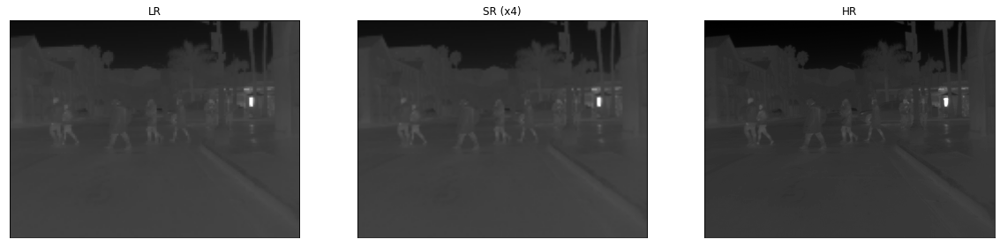

In [17]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9562664154098199


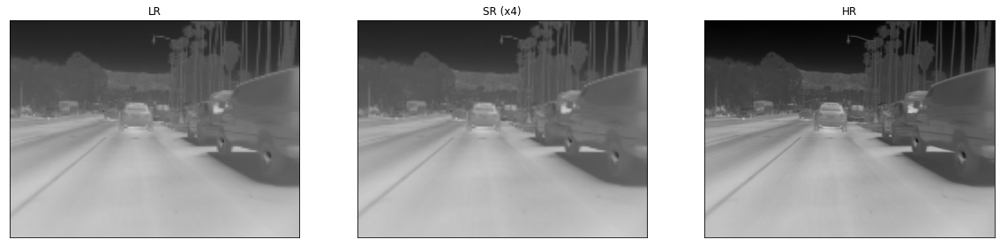

In [18]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8843765921036393


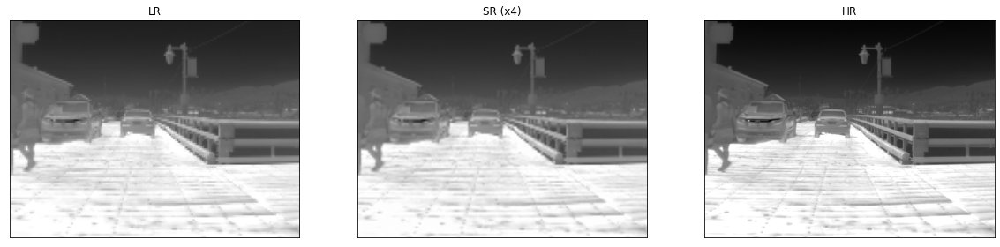

In [19]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail + Loss_tee with Gaussian (Only WDSR with 2 Different Kernel loss_detail) (aplpha =1, delta=1) (Only Kirsch):

0.9814432792510445


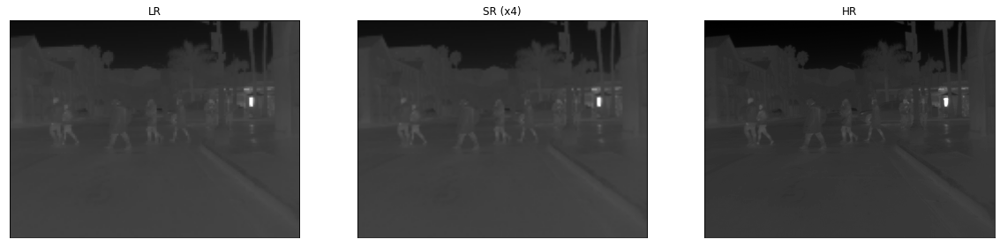

In [17]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9562664154098199


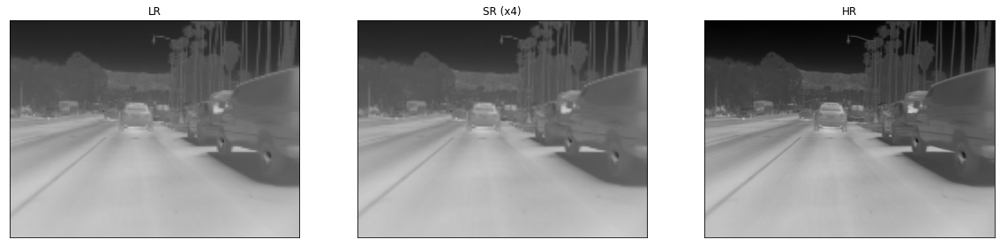

In [18]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8843765921036393


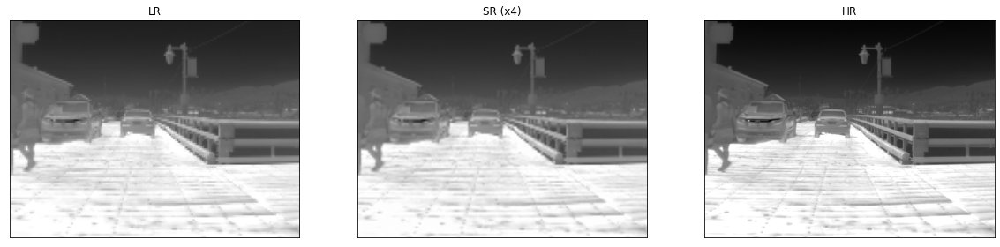

In [19]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail + Loss_tee with Gaussian (Only WDSR with 2 Different Kernel loss_detail) (aplpha =1, delta=1) (New WDSR 3):

0.9818525517260763


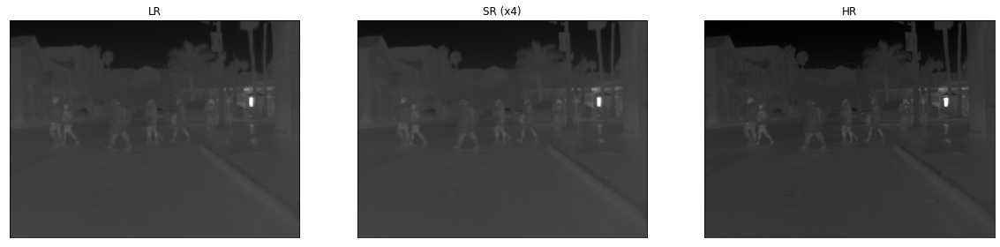

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.957397670263494


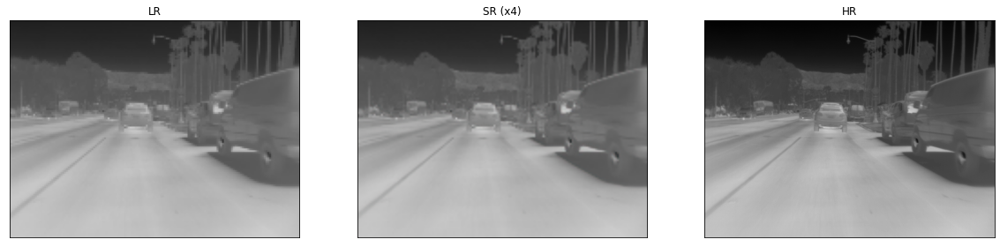

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8860708859593468


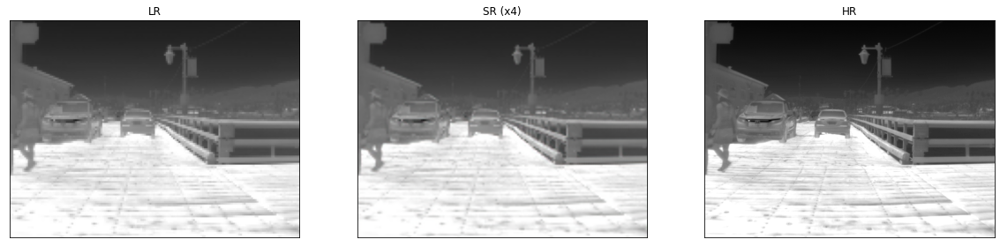

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail + Loss_tee with Gaussian (Only WDSR with 2 Different Kernel loss_detail) (aplpha =1, delta=1) (New WDSR 2):

0.9832392087625551


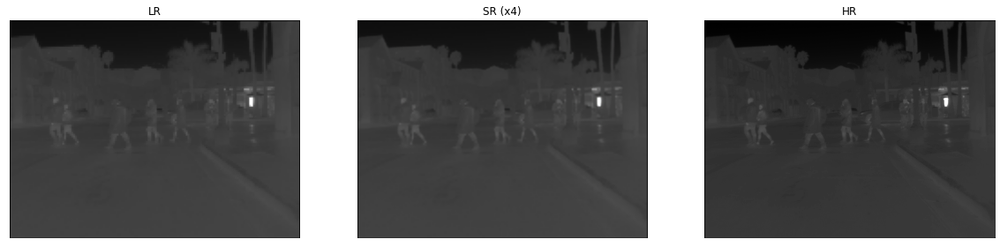

In [16]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9602331164583088


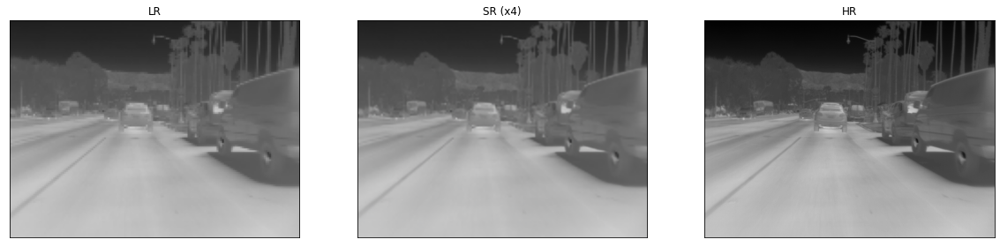

In [17]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8889300315673624


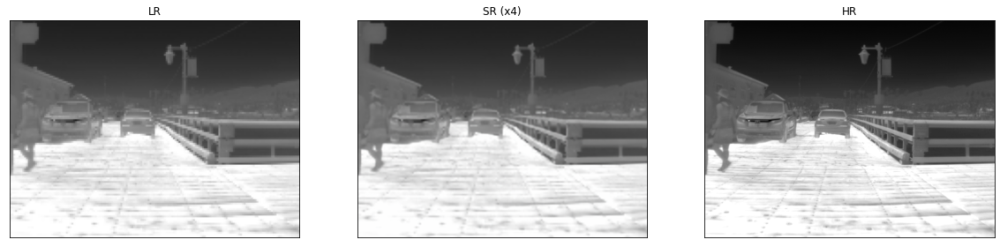

In [18]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail + Loss_tee with Gaussian (Only WDSR with 2 Different Kernel loss_detail) (aplpha =1, delta=1) (New WDSR):

0.9833898483787373


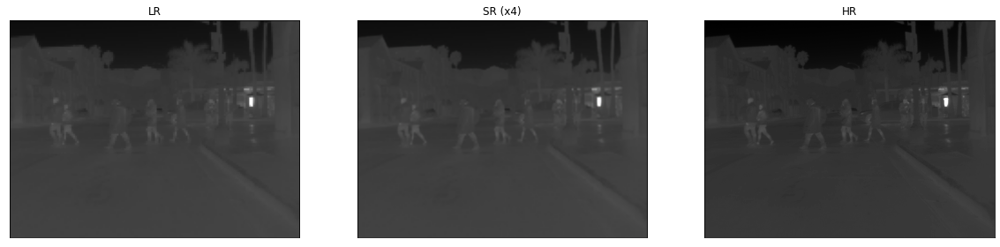

In [16]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9606496064404205


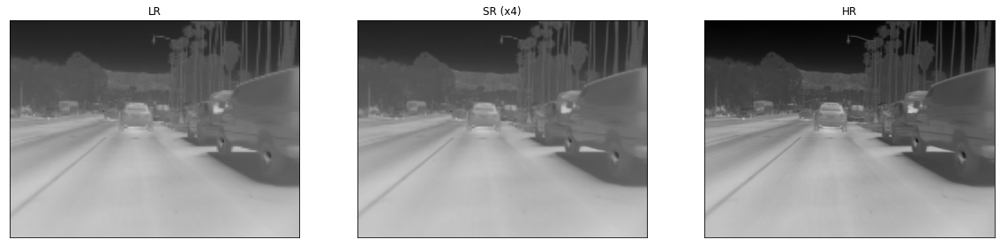

In [17]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8897365848224341


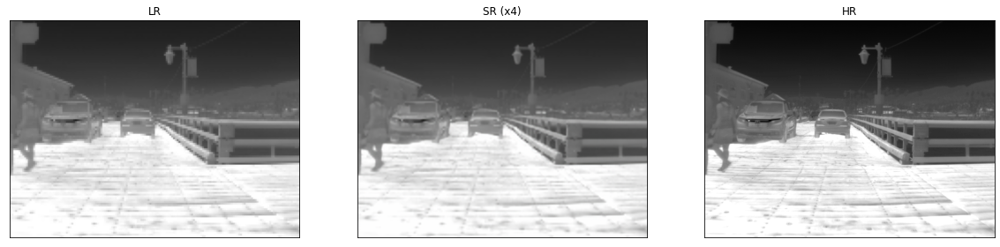

In [18]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + edge_MAE+ MAE + Loss_detail + Loss_tee with Gaussian (Only WDSR with 2 Different Kernel loss_detail) (aplpha =1, delta=1) (WDSR):

0.9825369429476452


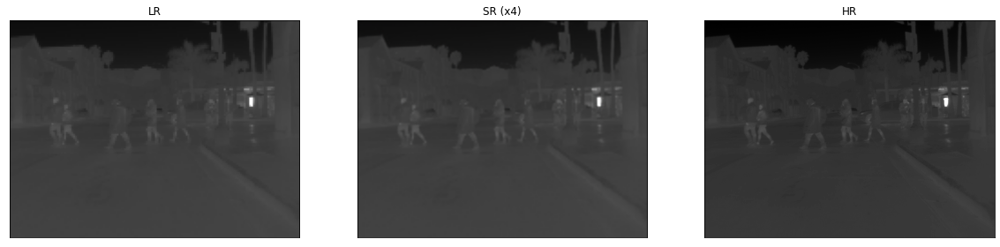

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.958416488449775


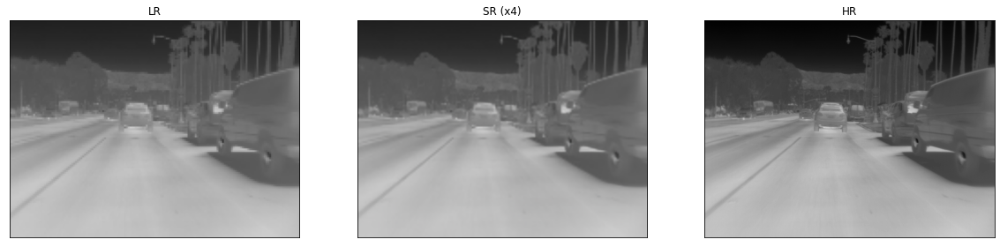

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8858593041630605


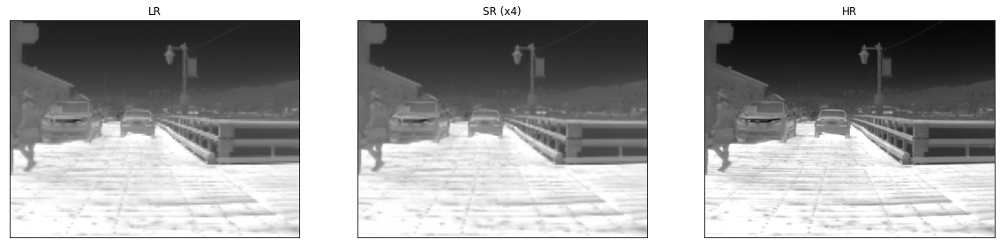

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + edge_MAE+ MAE + Loss_detail + Loss_tee with Gaussian (Only WDSR with 2 Different Kernel loss_detail) (aplpha =1, delta=1) (WDSR):

0.9847713211688488


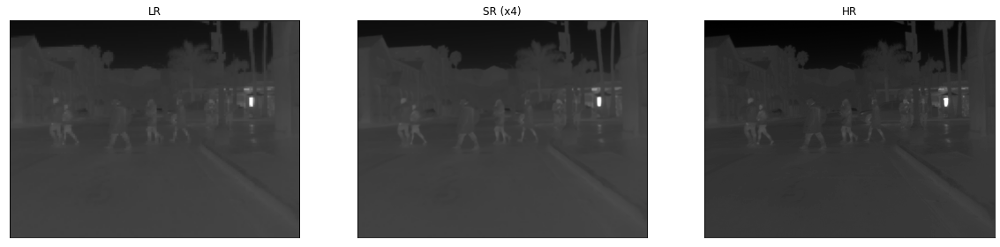

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9652199849541867


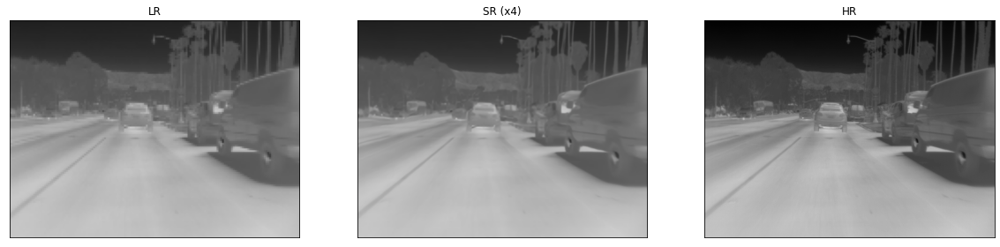

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8951306517806


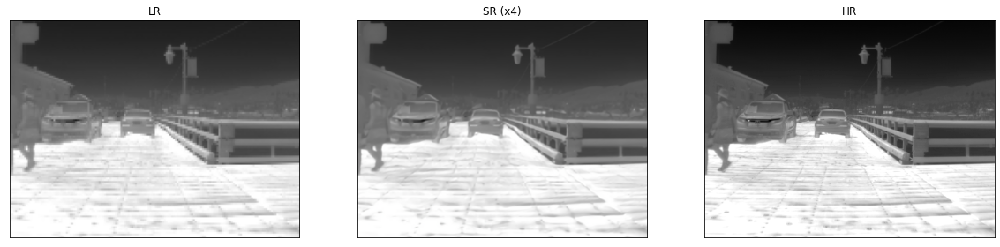

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail + Loss_tee with Gaussian (Only WDSR with 2 Different Kernel loss_detail) (aplpha =1, delta=1) (WDSR+Edge):

0.9812940203011018


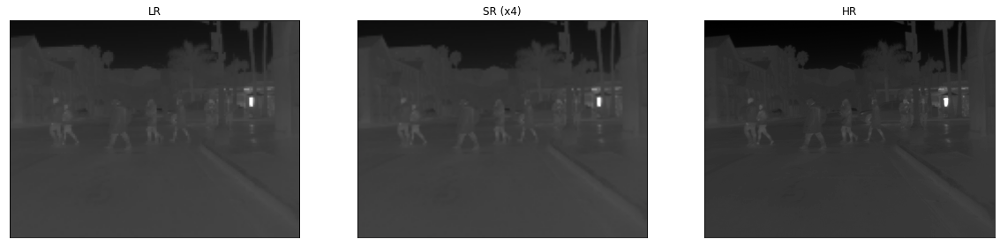

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9559721843340401


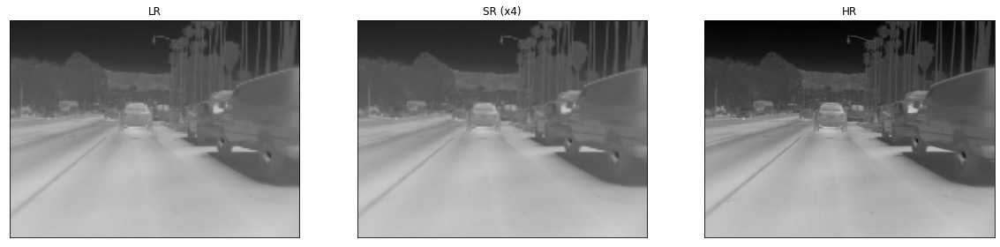

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8846370972237371


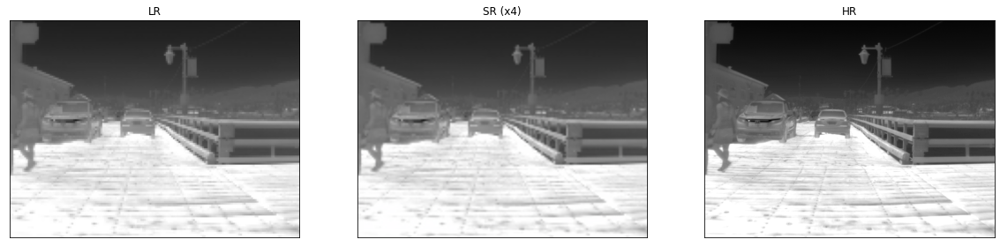

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + edge_mae + MAE + Loss_detail + Loss_tee with Gaussian (Only WDSR with 2 Different Kernel loss_detail) (aplpha =1, delta=1) (WDSR+Edge):

0.9814211292342216


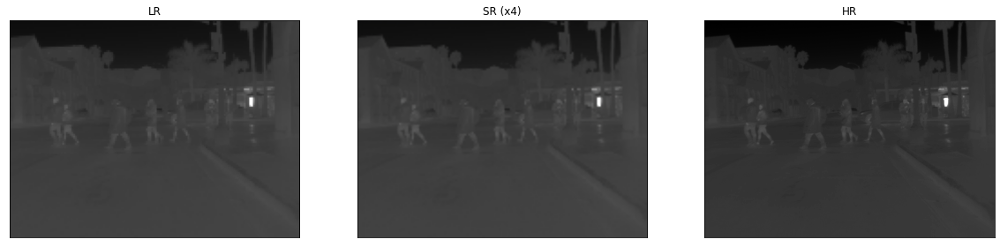

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9560200202072617


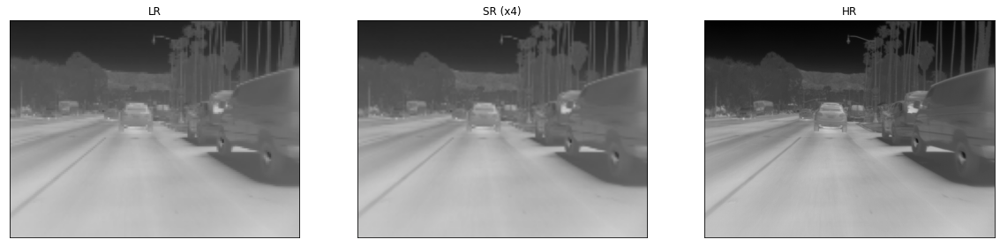

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8846757730400807


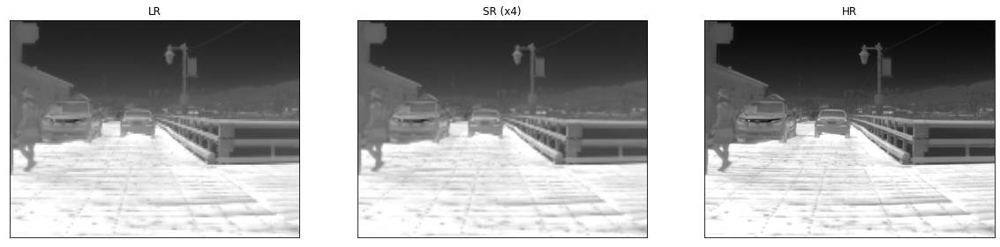

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## MAE + Loss_detail + Loss_tee with Gaussian (Only WDSR with 2 Different Kernel loss_detail) (aplpha =1, delta=1):

0.984849387921294


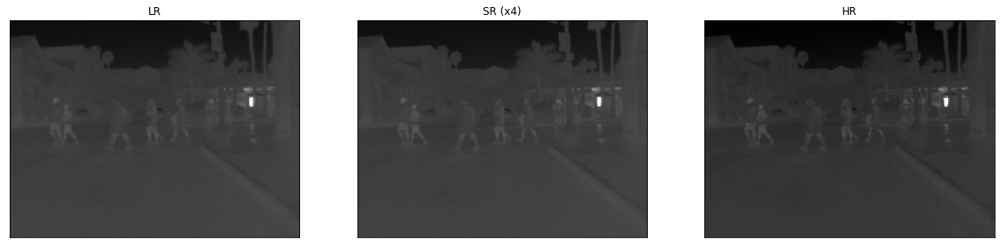

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9650691745611952


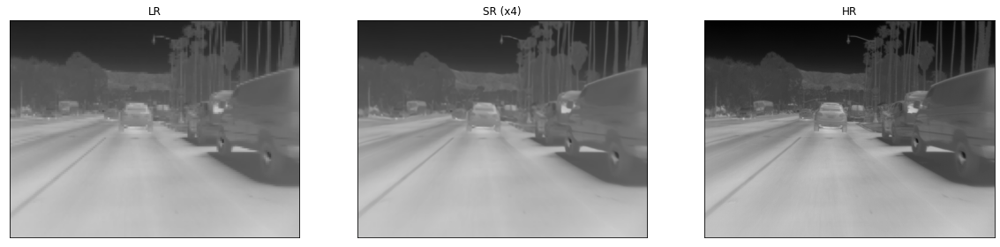

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8956253596555802


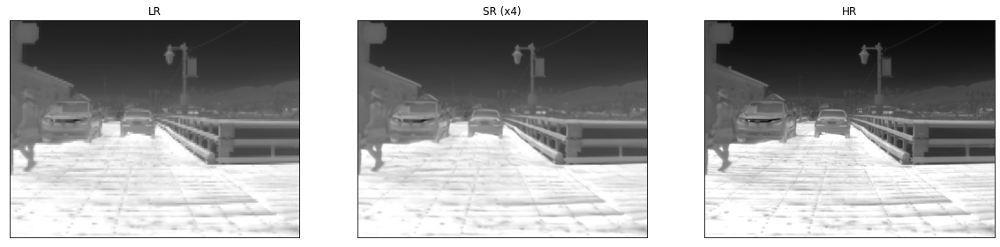

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail + Loss_tee with Gaussian (Only WDSR with 2 Different Kernel loss_detail) (aplpha =1, delta=1):

0.9850252240952383


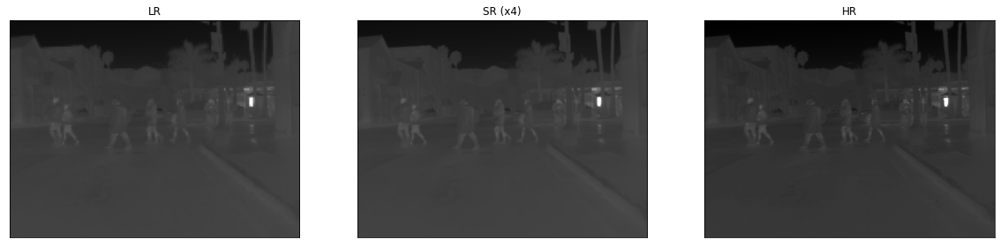

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9655179878957904


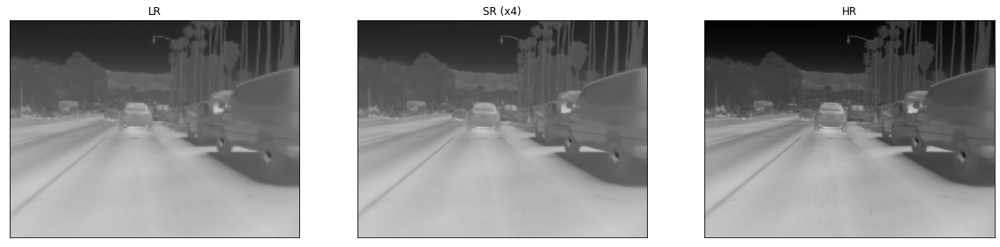

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8952240299777088


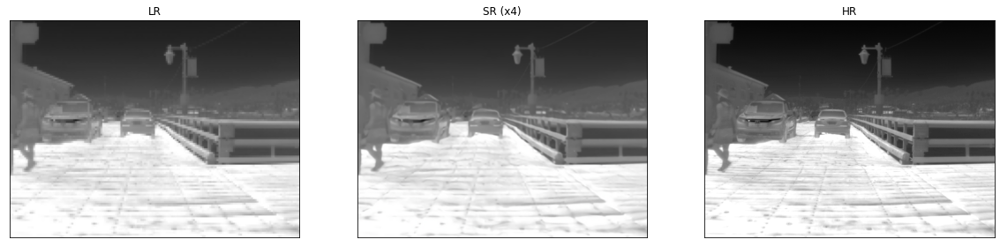

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail + Loss_tee with Gaussian (Only WDSR) (aplpha =1, delta=0.1):

0.9845761891716908


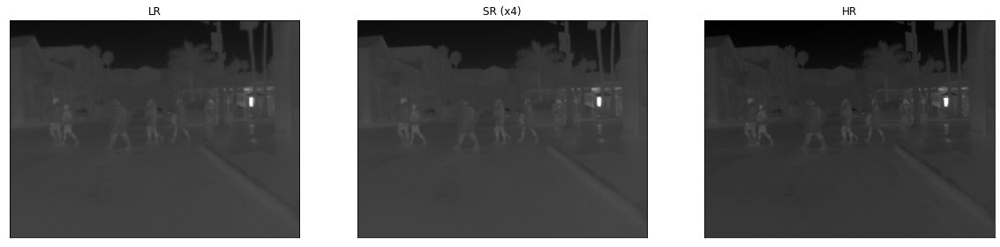

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9643219137893949


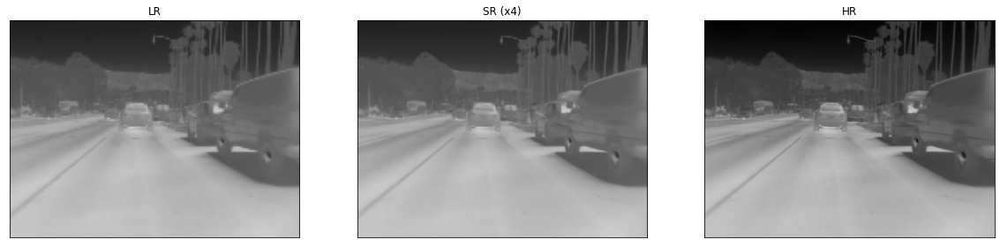

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8940875979986892


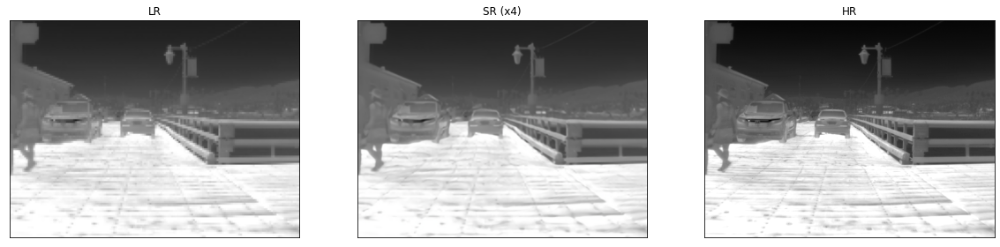

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail + Loss_tee with Gaussian (Only WDSR) (aplpha =1, delta=10):

0.9848289464543702


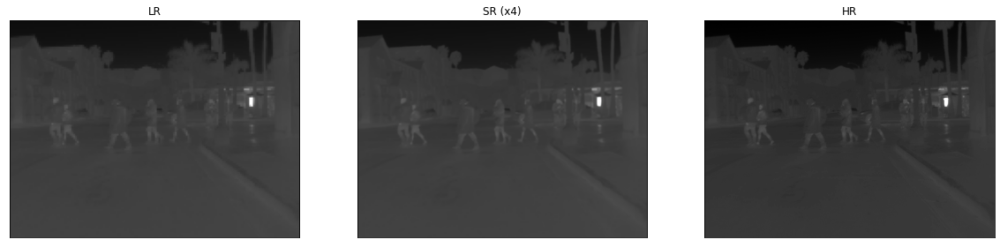

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9649115432323921


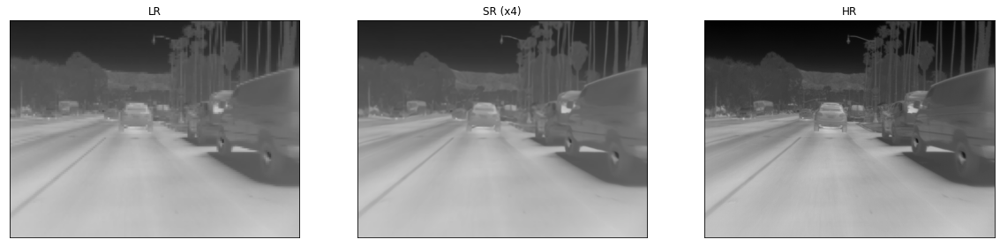

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8943828333140618


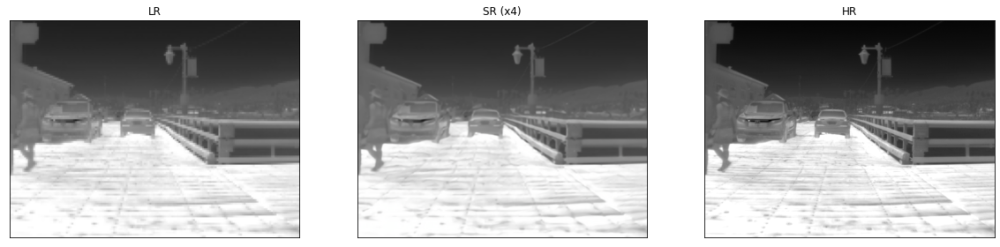

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail + Loss_tee with Gaussian (Only WDSR) (aplpha =1):

0.9849517703608788


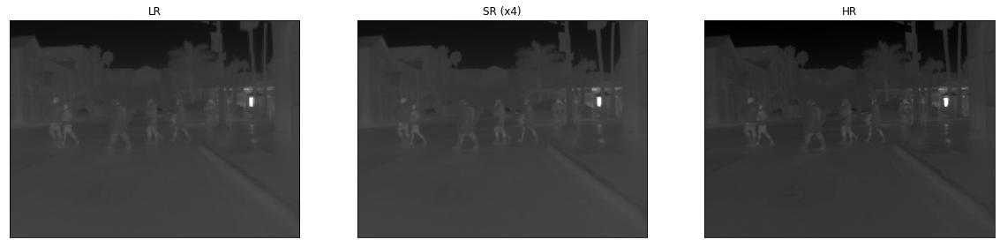

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9656848939916927


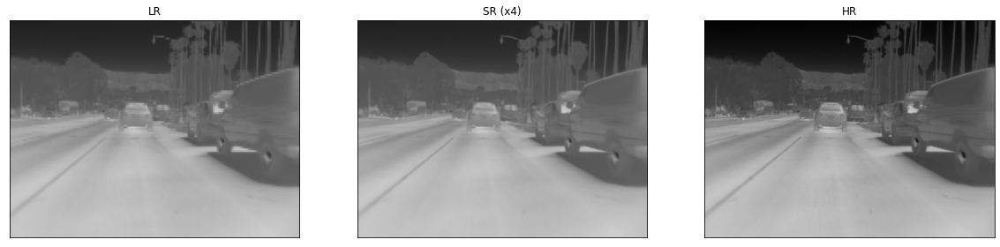

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8947571357782005


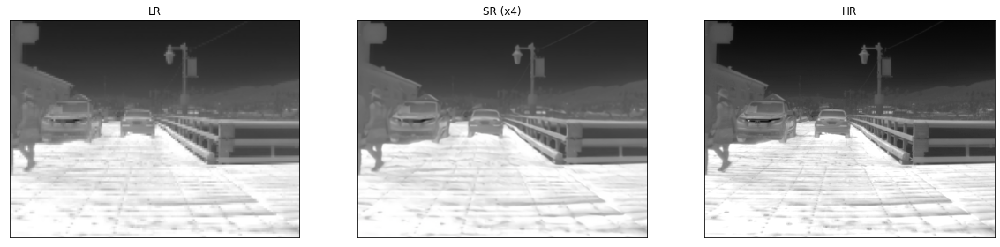

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail with Gaussian (Only WDSR) (aplpha =10):

0.9822089190437677


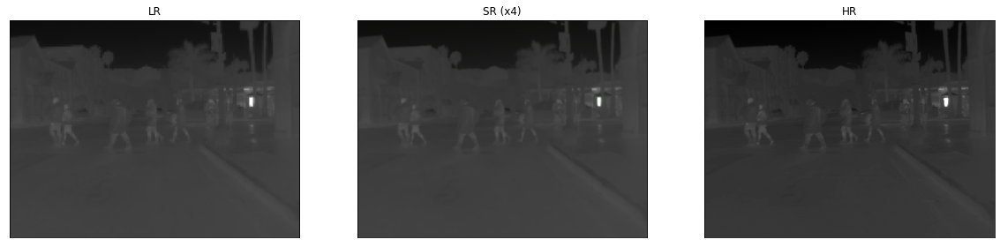

In [17]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9592850789203724


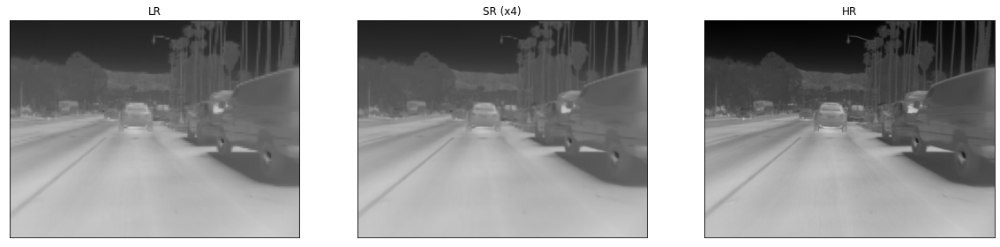

In [18]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.883464606577437


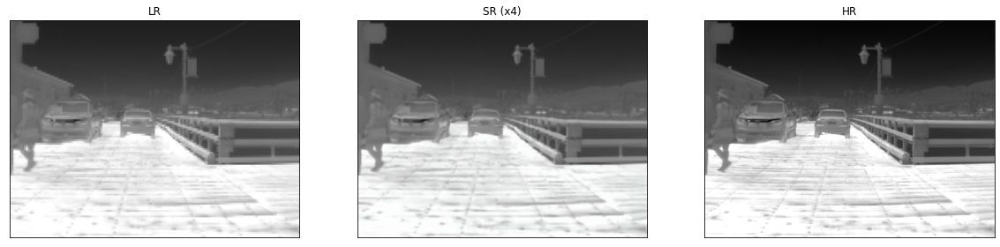

In [19]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail with Gaussian (2 Layers) (Only WDSR):

0.9848374256122937


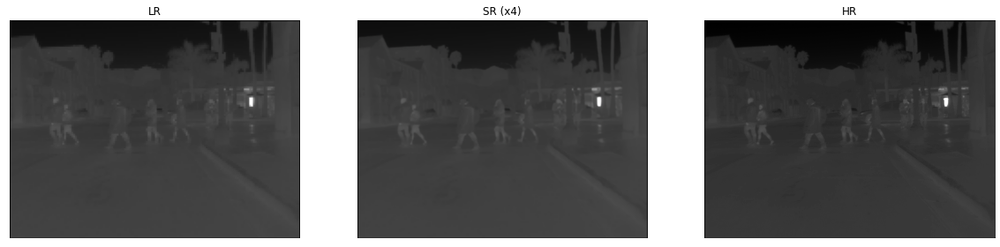

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9647019255091437


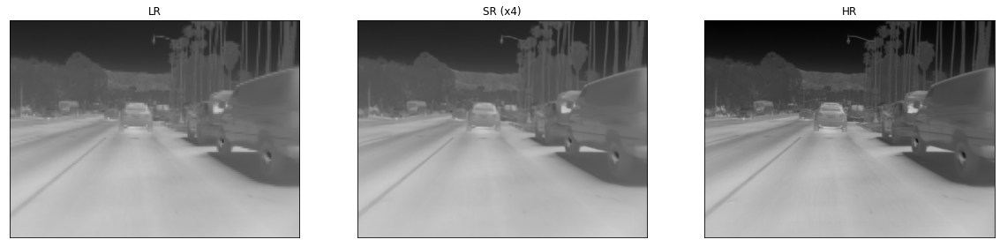

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8951437525661019


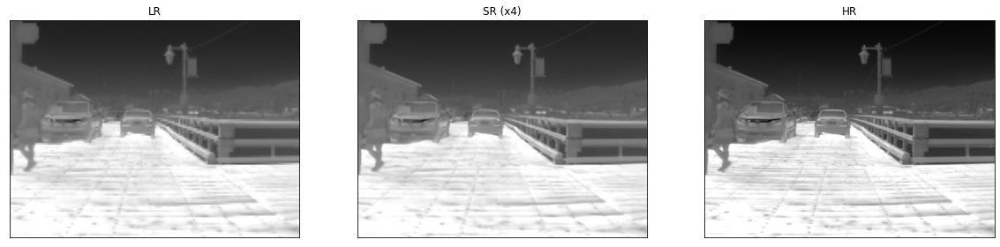

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail with Gaussian (Only WDSR):

0.9848485129350945


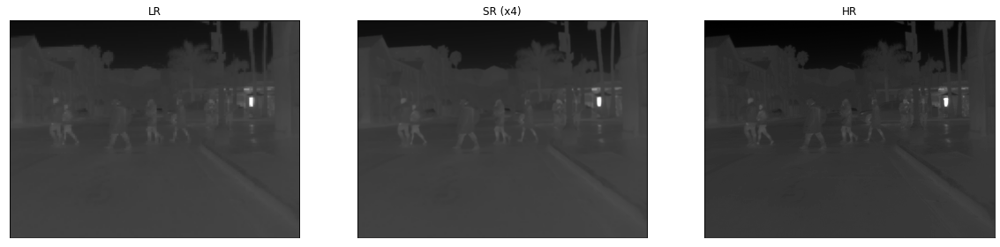

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9648402141965491


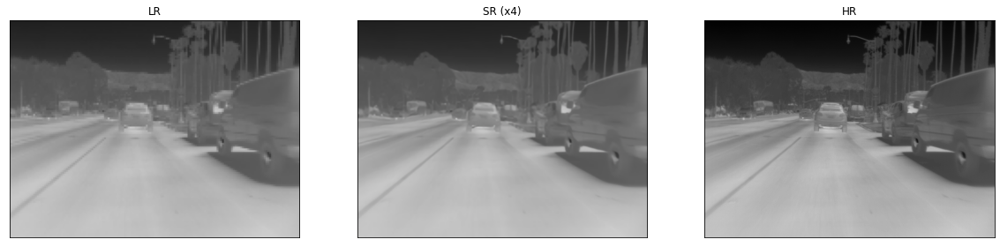

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8950145370627063


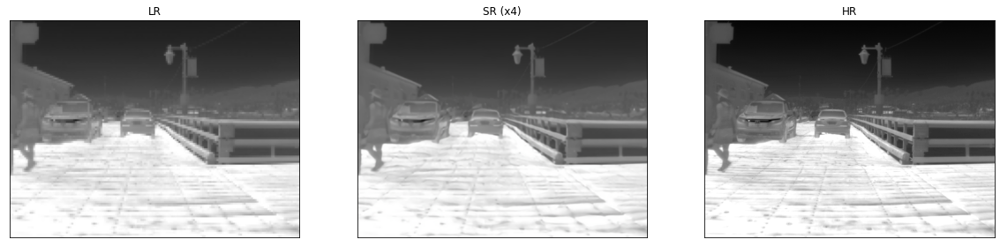

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail (Only WDSR):

0.9846671933997614


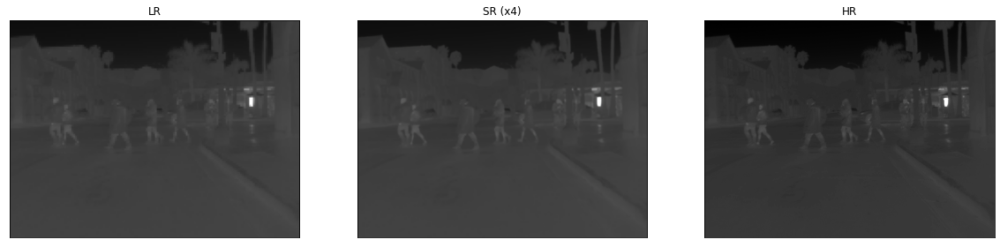

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9651480977414129


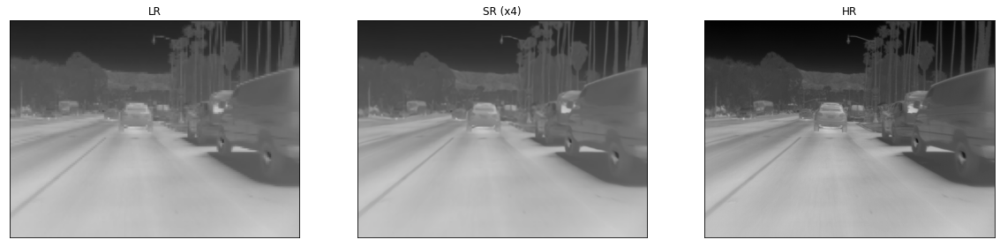

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8944981015214675


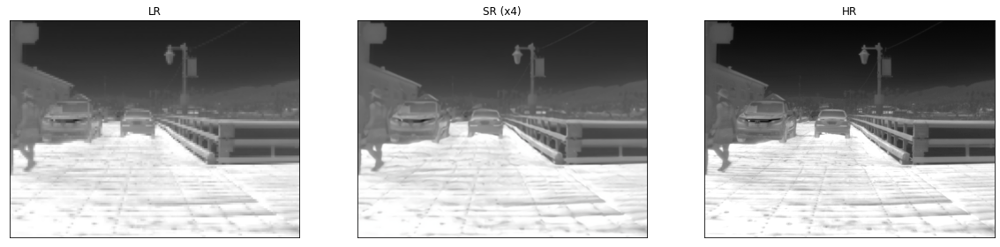

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + Loss_detail:

0.9813726083750446


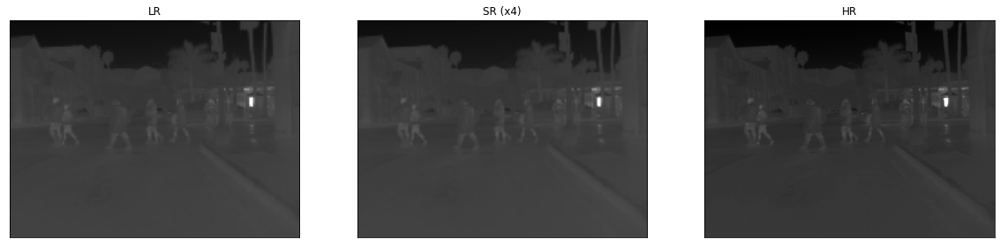

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9558767823905037


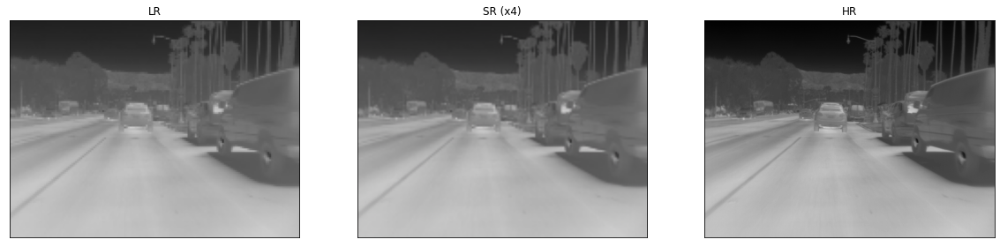

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8835771366835482


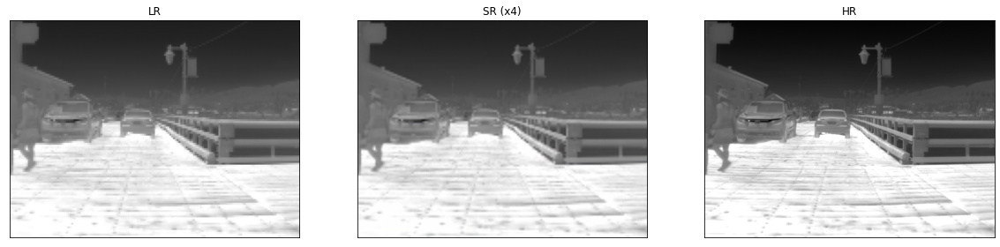

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + mae_sobel + mae_edge:

0.9835294081048517


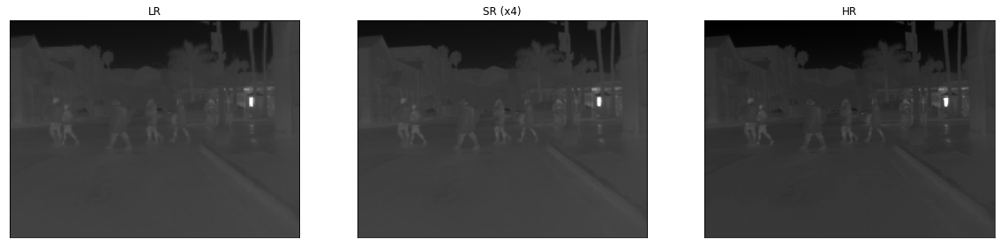

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9591543296154538


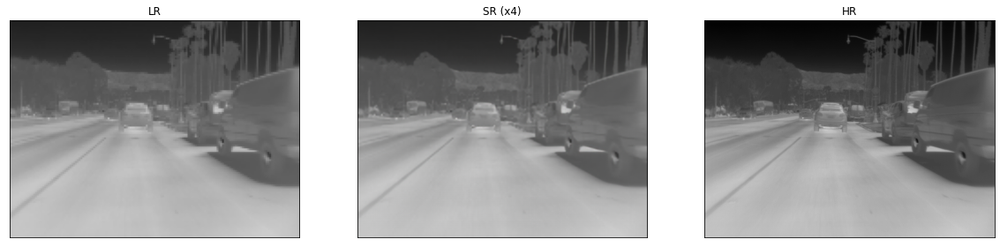

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.889987796915127


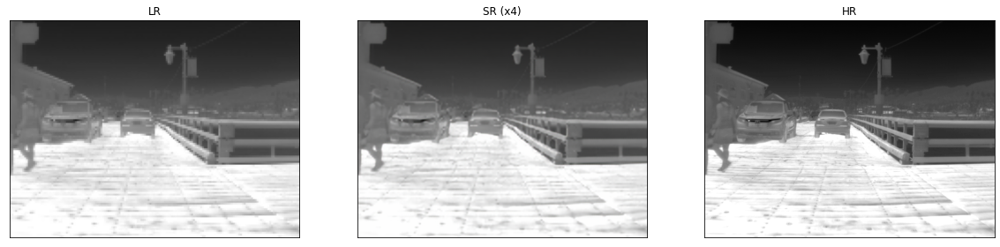

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE + mae_sobel(tensorflow): 

0.9831156108547444


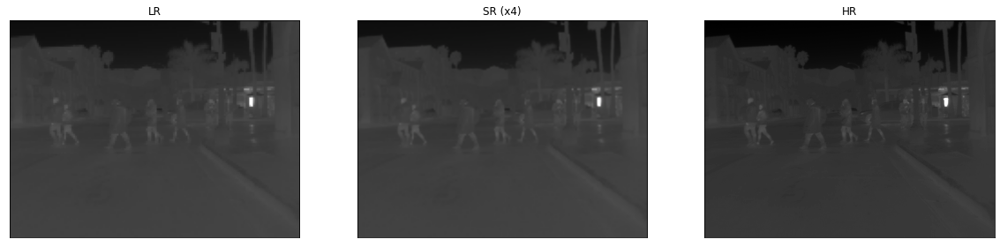

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9597193668842554


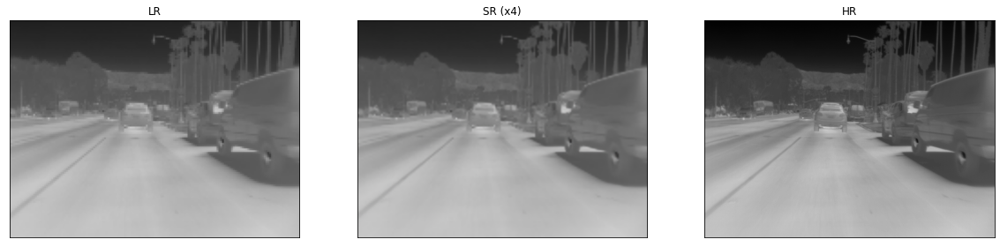

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8874006975576397


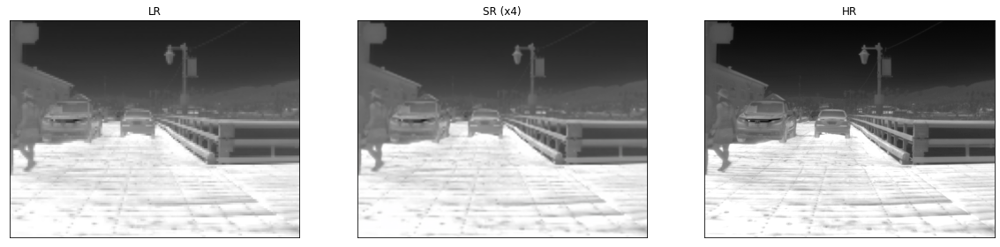

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE (gaussian filter):

0.9829134616652683


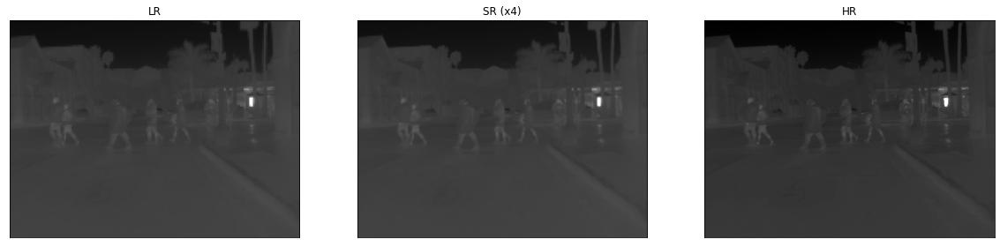

In [17]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9594108424661272


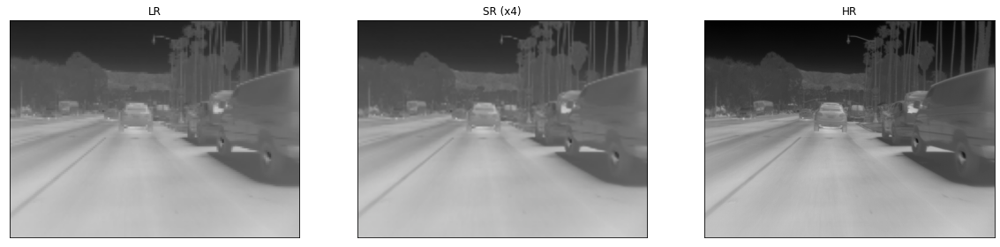

In [18]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8892383810910883


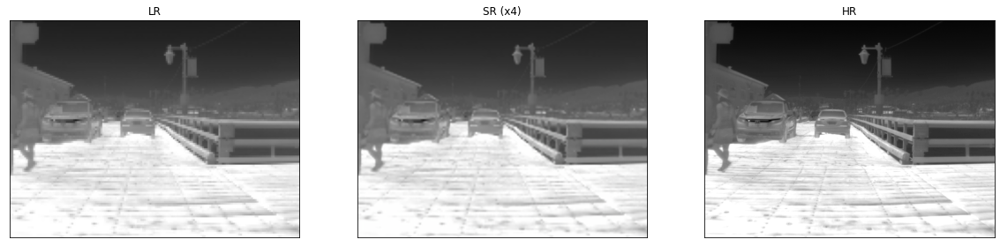

In [19]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + Gradient + MAE: 

0.9798894624526714


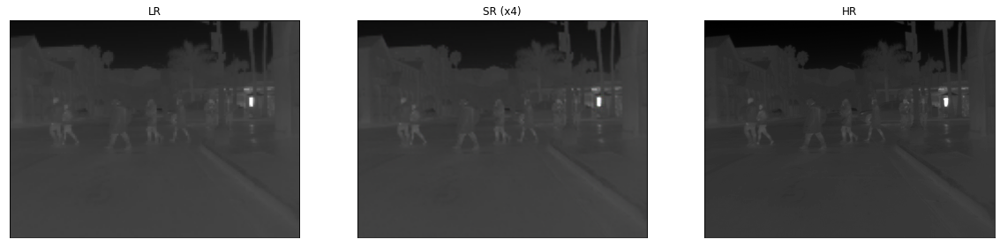

In [16]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9511658559595295


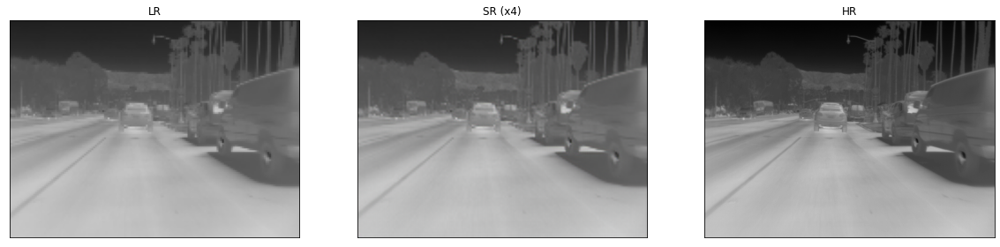

In [17]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8792478930872428


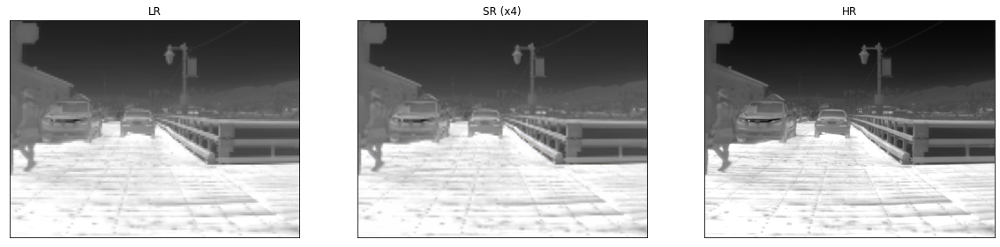

In [18]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

0.9659797746629243


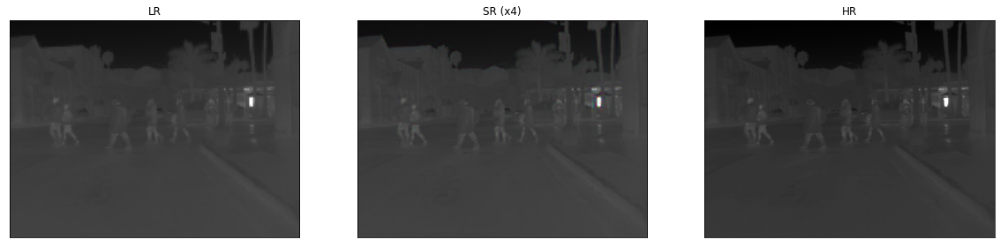

In [17]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9158521755689176


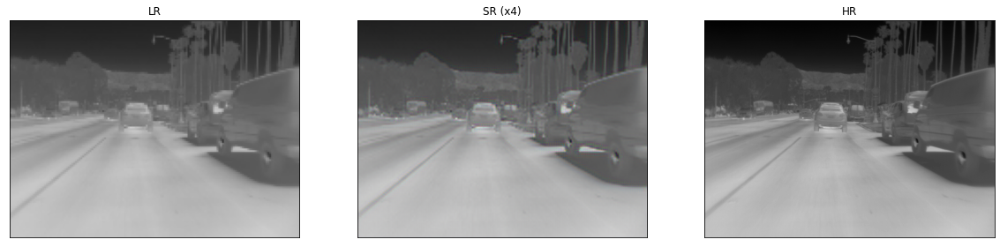

In [18]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8248303287254691


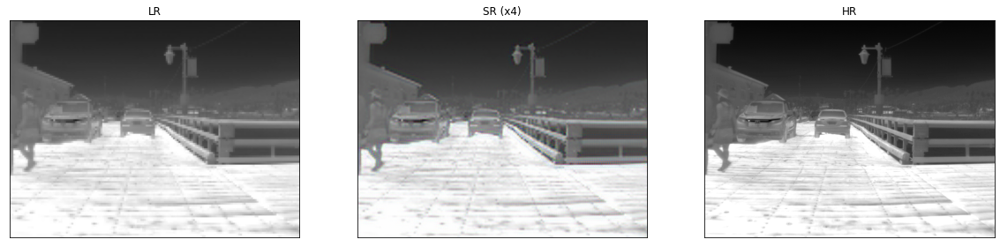

In [19]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + GSE + MAE:

0.976069957057531


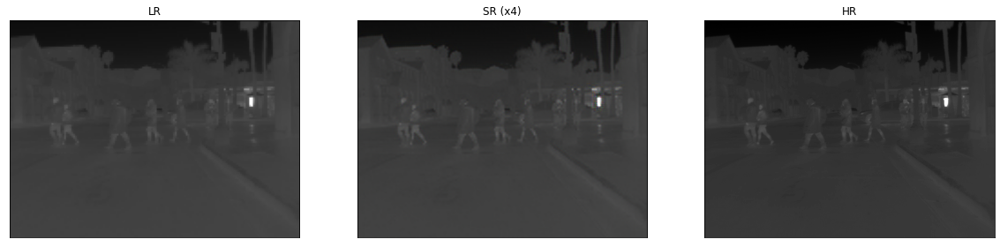

In [16]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9394863335814874


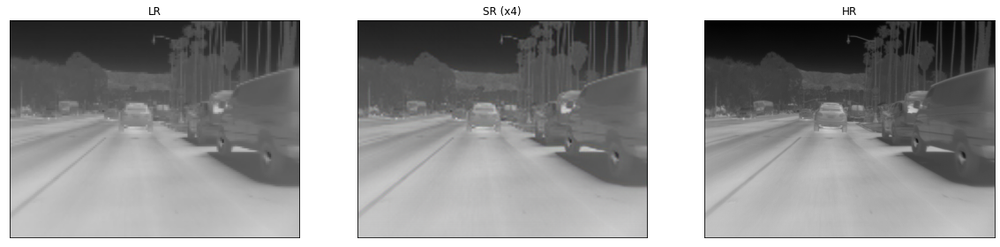

In [17]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8619918225288787


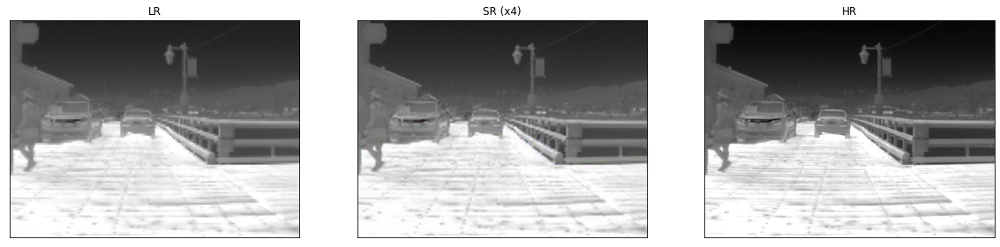

In [18]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM - SSIM + MAE:

0.9810933509550249


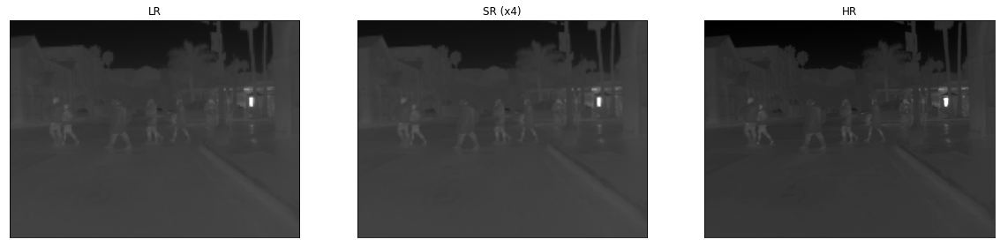

In [17]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.95571236175392


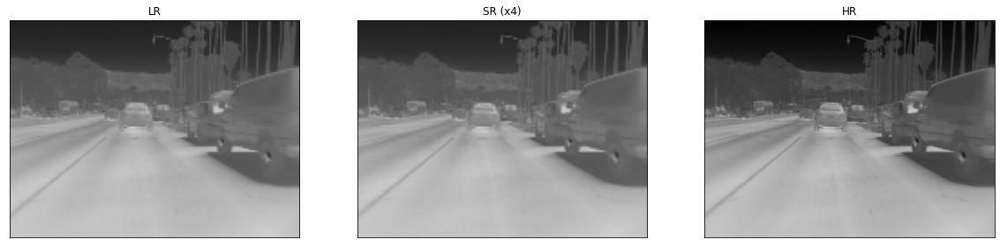

In [18]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.88344104025177


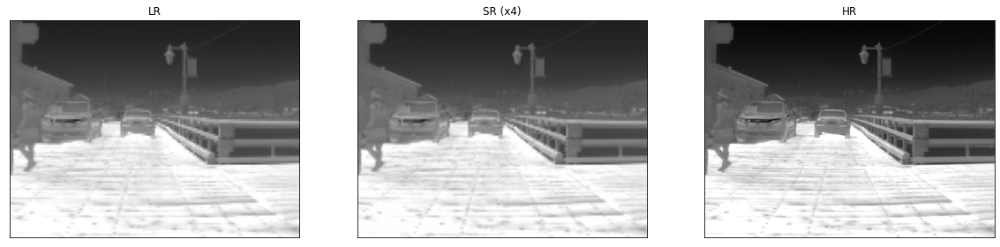

In [19]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## -MSSIM + MAE:

0.9811883979018994


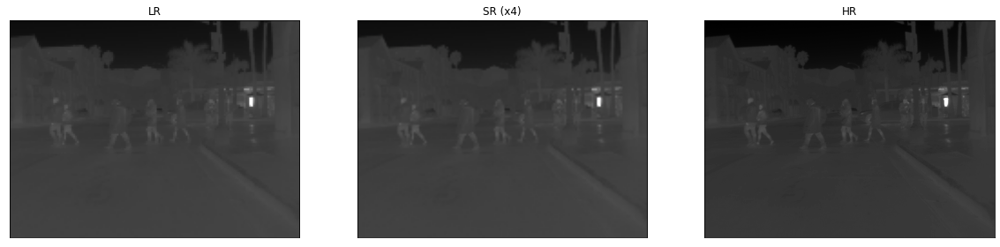

In [16]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9558718115635161


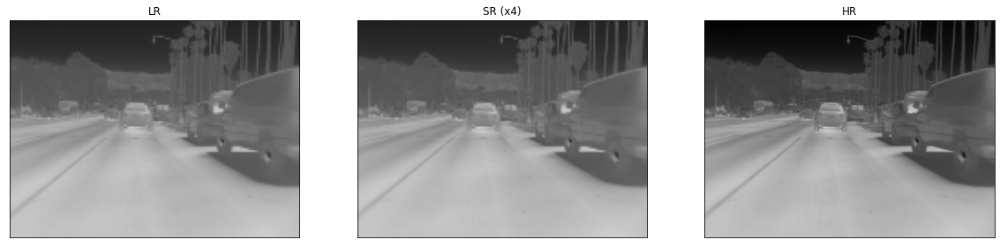

In [17]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.884858209036259


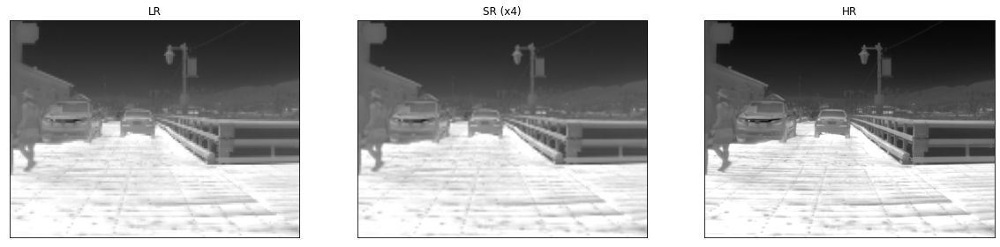

In [18]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## MSSIM + MAE:

0.9160457304514076


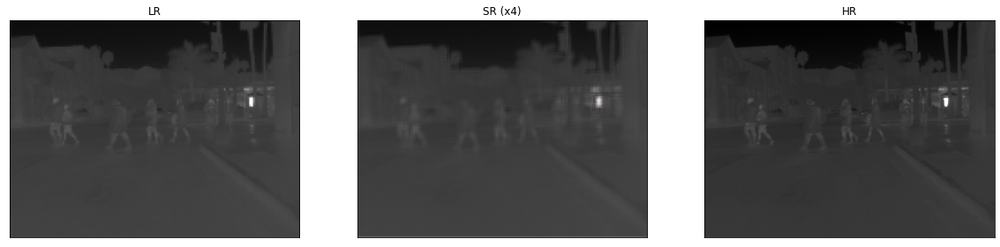

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.7379590238170032


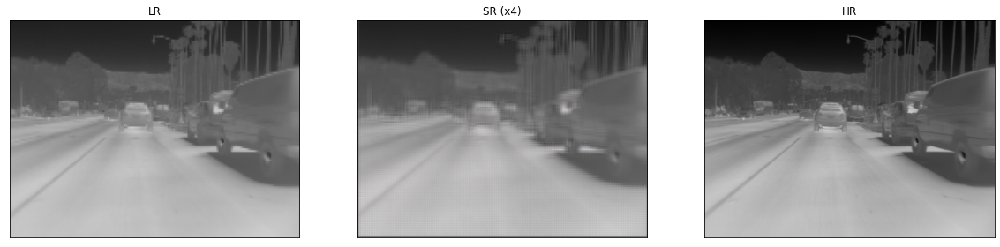

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.601837028276538


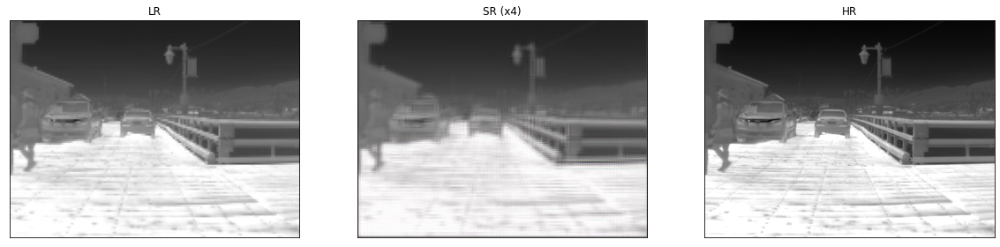

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## MSSIM + SSIM + MAE + Gradient:

0.9757991949934696


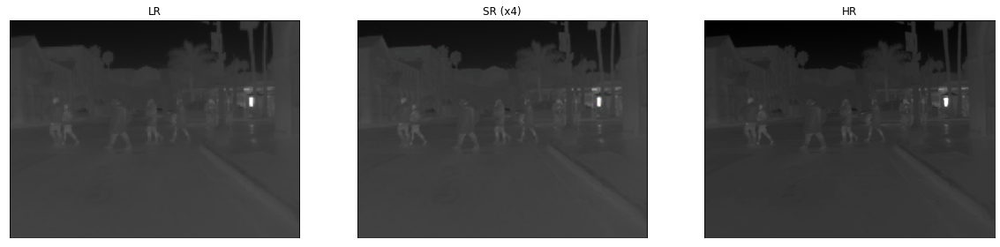

In [16]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.939928260015446


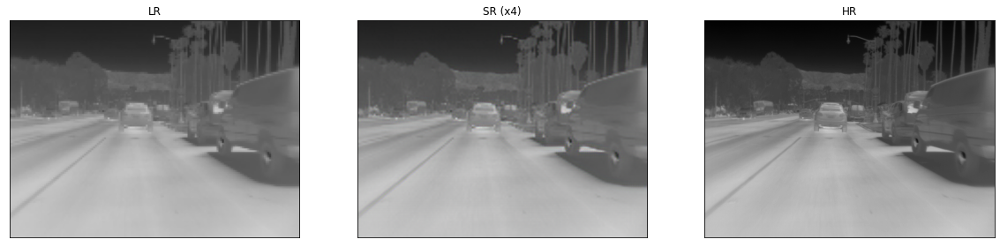

In [17]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8593852972915651


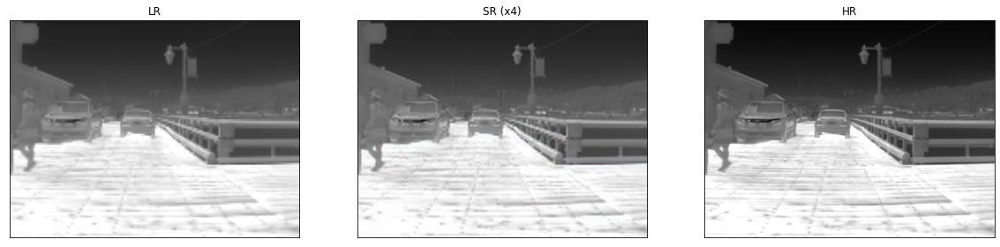

In [18]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## MSSIM + MAE + Gradient:

0.9766882439091679


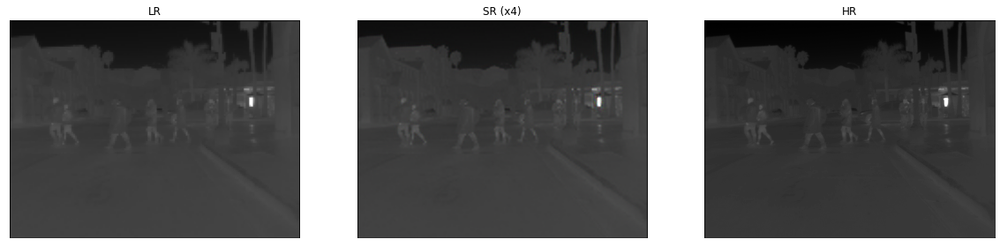

In [16]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9431242450575337


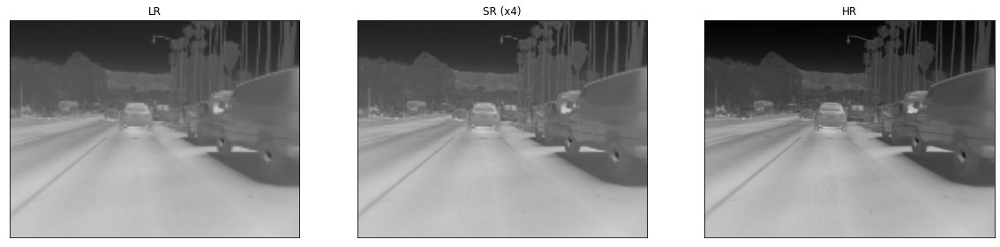

In [17]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8665608168065626


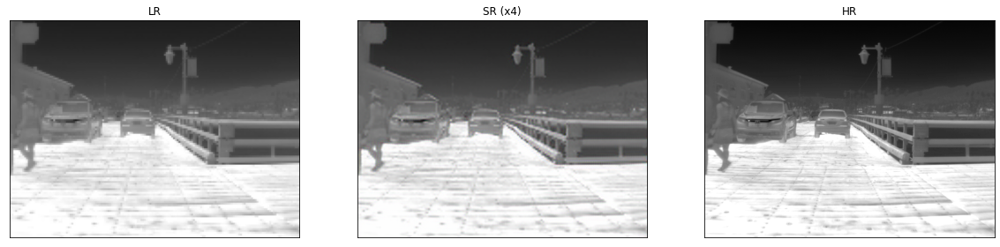

In [18]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## WDSR + Edge:

0.9835921009334223


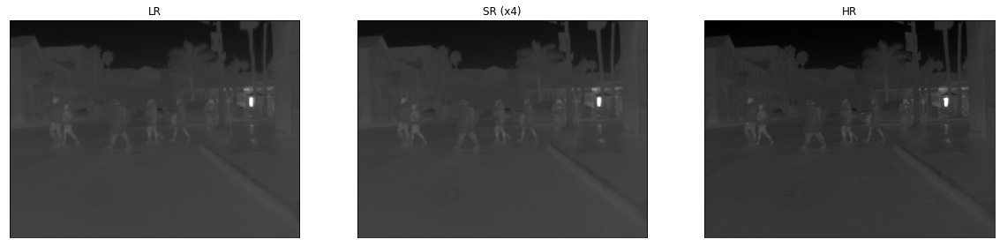

In [22]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9612773148852315


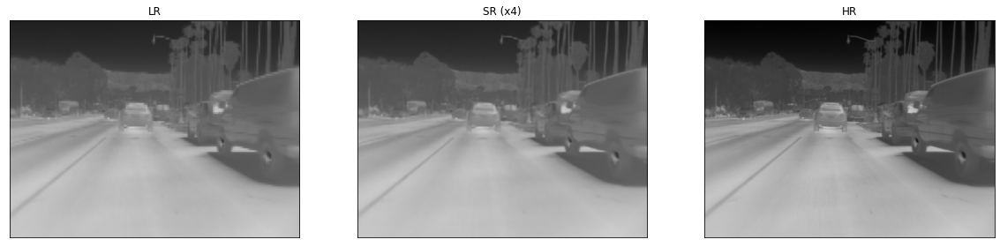

In [23]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8881480486108364


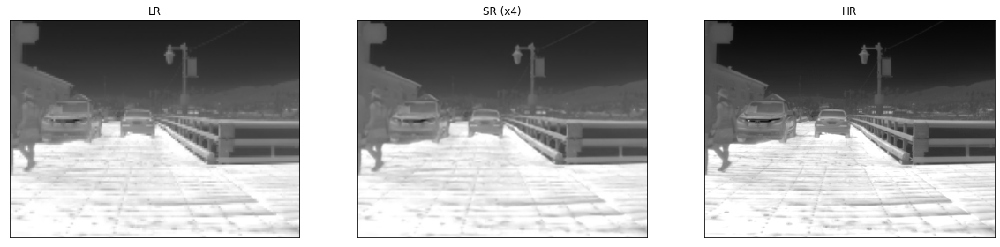

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')

## WDSR+Edge (2nd Edition):

0.9760804533423888


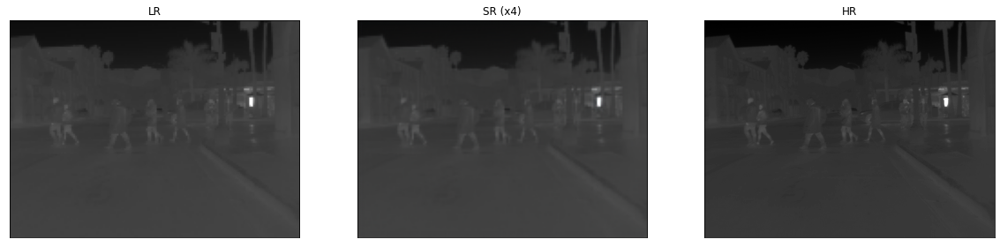

In [15]:
resolve_and_plot('demo/0004x4.png','demo/0004.png')

0.9439331975508427


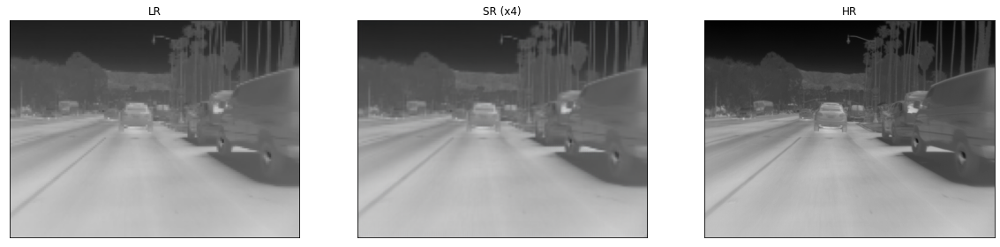

In [16]:
resolve_and_plot('demo/1064x4.png','demo/1064.png')

0.8653522350905934


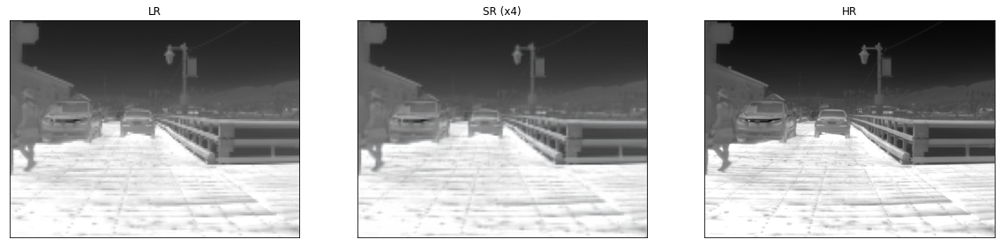

In [17]:
resolve_and_plot('demo/0303x4.png','demo/0303.png')